In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import os
import sys
import scipy
import matplotlib
from matplotlib import rcParams
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100
rcParams['pdf.fonttype'] = 42
sc.settings.figdir = './figures/figure6_and_S13/'
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 600, vector_friendly = True, format = 'pdf')

In [2]:
def Barplot(which_var, adata, var='clusters', height=3, color = False):
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
#     ax1.figure.savefig(str(sc.settings.figdir)+'/barplot_'+var+'_proportions_'+which_var+'.pdf', bbox_inches='tight',
#                        dpi=300, orientation='landscape', format= 'pdf', optimize=True)

In [3]:
cd F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\

F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline


G:\Miniconda3\envs\omicverse\lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [10]:
data_dir = '/PROJECTS/PROJECT_HUMAN_FETAL_COCHLEAE/WORKPLACE/R/sc_pipeline/'
meta = pd.read_csv(data_dir+'metadata.csv',index_col=0)
meta

         sample_id           donor  gw  gender 10xKit sequencing   dataset  \
sample                                                                       
9.5gw          gw9  not_provided_1   9  female    SC3  snRNA-seq    public   
11.2gw        gw11  not_provided_2  11    male    SC3  snRNA-seq    public   
14+3gw        gw14       F20240701  14    male    SC3  snRNA-seq  in-house   
15gw          gw15  not_provided_3  15  female    SC3  scRNA-seq    public   
16+4gw        gw16       F20241018  16    male    SC3  snRNA-seq  in-house   
17+2gw      gw17_1       F20220807  17    male    SC3  snRNA-seq  in-house   
17+3gw      gw17_2       F20240928  17  female    SC3  snRNA-seq  in-house   
17gw        gw17_3  not_provided_4  17    male    SC3  scRNA-seq    public   
18+3gw        gw18       F20220806  18    male    SC3  snRNA-seq  in-house   
20gw          gw20     F20240928-2  20  female    SC3  snRNA-seq  in-house   
22+2gw_1    gw22_1       F20241021  22    male    SC3  snRNA-seq

AnnData object with n_obs × n_vars = 4788 × 27444
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final_v4', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0', 'cell_type_final_v5', 'devtime', 'subclasses', 'leiden_scanvi_1.2'
    var: 'gene_ids-0-0', 'feature_types-0-0', 'Gene-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'highly_variable-0-0', 'means-0-0', 'dispersions-0-0', 'dispersions_norm-0-0', 'n_cells-0-0', 'ge

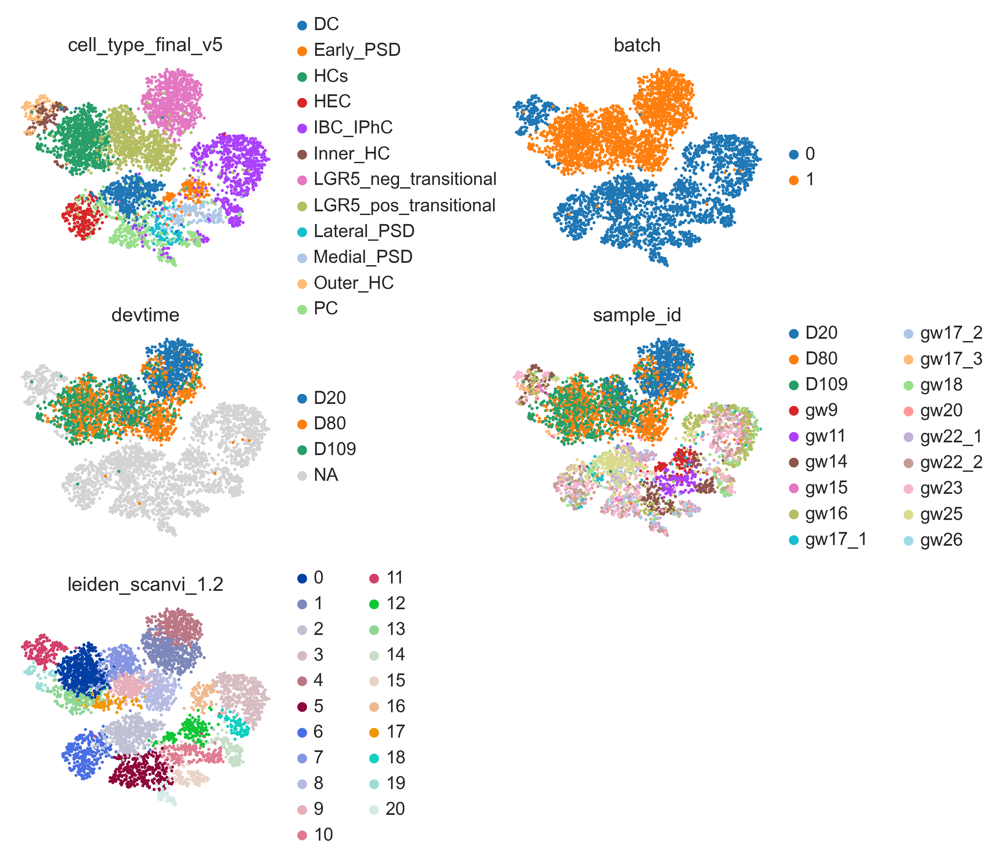

In [13]:
adata_comparative=sc.read('adata_comparative_fixed.h5ad')
adata_comparative
sc.set_figure_params(figsize=(3,3),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata_comparative, color=['cell_type_final_v5','batch','devtime','sample_id',
                                     'leiden_scanvi_1.2',], size=20,save='_comparative.pdf',
           wspace=0.65,ncols=2)

In [5]:
tissue_coe = adata_comparative[adata_comparative.obs['batch'] == '0', :].copy()
#set to age bins
# Extract gestational week number from 'sample_id' (e.g., "gw16" → 16)
tissue_coe.obs["gestational_week"] = tissue_coe.obs["sample_id"].str.extract(r'(\d+)').astype(int)

# Define bins and labels
cut_bins = [0, 12,16,20,26]
cut_labels = ['< 12','< 16','<20','<26']

# Bin the gestational weeks
tissue_coe.obs["age_bins"] = pd.cut(
    tissue_coe.obs["gestational_week"],
    bins=cut_bins,
    labels=cut_labels
).astype("str")

# Ensure categorical ordering (optional)
tissue_coe.obs["age_bins"] = pd.Categorical(
    tissue_coe.obs["age_bins"],
    categories=cut_labels,
    ordered=True
)
tissue_coe.obs["age_bins"]
# Convert covariate to continous
tissue_coe.obs['age_bins'] = tissue_coe.obs['age_bins'].cat.codes
tissue_coe.obs['age_bins']
tissue_coe.obs.groupby(['gestational_week','sample_id','age_bins']).apply(len)
# Combine 'cell_type_final_v5' and 'age_bins' with an underscore
tissue_coe.obs["cell_type_final_v5_age"] = (
    tissue_coe.obs["cell_type_final_v5"].astype(str) + "_" + tissue_coe.obs["age_bins"].astype(str)
)

# If you want to replace the original column instead of creating a new one:
# tissue_coe.obs["cell_type_final_v5"] = tissue_coe.obs["cell_type_final_v5"] + "_" + tissue_coe.obs["age_bins"]
tissue_coe.obs["cell_type_final_v5_age"].value_counts()
exclude_clusters = ['DC_0','PC_0','Medial_PSD_2','IBC_IPhC_0']
tissue_coe= tissue_coe[~tissue_coe.obs['cell_type_final_v5_age'].isin(exclude_clusters), :]

9.5gw_AAAGAACCAAACACGG-0     < 12
9.5gw_AAAGAACGTAACGTTC-0     < 12
9.5gw_AAAGTCCAGAGGCTGT-0     < 12
9.5gw_AAAGTCCCATGAAAGT-0     < 12
9.5gw_AAAGTCCGTTCTGAGT-0     < 12
                             ... 
26+3gw_TCACTATTCTACGGGC-0     <26
26+3gw_TCCCATGAGGTGCCAA-0     <26
26+3gw_TCTTCCTTCGTGGGAA-0     <26
26+3gw_TGTCCACCAGGTACGA-0     <26
26+3gw_TTGGGTACAAGTGGGT-0     <26
Name: age_bins, Length: 2388, dtype: category
Categories (4, object): ['< 12' < '< 16' < '<20' < '<26']

9.5gw_AAAGAACCAAACACGG-0     0
9.5gw_AAAGAACGTAACGTTC-0     0
9.5gw_AAAGTCCAGAGGCTGT-0     0
9.5gw_AAAGTCCCATGAAAGT-0     0
9.5gw_AAAGTCCGTTCTGAGT-0     0
                            ..
26+3gw_TCACTATTCTACGGGC-0    3
26+3gw_TCCCATGAGGTGCCAA-0    3
26+3gw_TCTTCCTTCGTGGGAA-0    3
26+3gw_TGTCCACCAGGTACGA-0    3
26+3gw_TTGGGTACAAGTGGGT-0    3
Name: age_bins, Length: 2388, dtype: int8

C:\Users\Dell\AppData\Local\Temp\ipykernel_34856\3387578603.py:27: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tissue_coe.obs.groupby(['gestational_week','sample_id','age_bins']).apply(len)
C:\Users\Dell\AppData\Local\Temp\ipykernel_34856\3387578603.py:27: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  tissue_coe.obs.groupby(['gestational_week','sample_id','age_bins']).apply(len)


gestational_week  sample_id  age_bins
9                 gw9        0           128
11                gw11       0           147
14                gw14       1           259
15                gw15       1           106
16                gw16       1           402
17                gw17_1     2            53
                  gw17_2     2           111
                  gw17_3     2            35
18                gw18       2           105
20                gw20       2            89
22                gw22_1     3           173
                  gw22_2     3           233
23                gw23       3           250
25                gw25       3           277
26                gw26       3            20
dtype: int64

cell_type_final_v5_age
IBC_IPhC_1       338
DC_3             308
IBC_IPhC_3       236
PC_3             224
HEC_3            148
Medial_PSD_0     139
IBC_IPhC_2       132
Early_PSD_0      118
PC_2             107
Lateral_PSD_1    100
DC_2              86
Inner_HC_1        85
PC_1              65
Outer_HC_1        54
Medial_PSD_1      51
HEC_1             41
HEC_2             33
Outer_HC_3        26
Inner_HC_2        20
Early_PSD_1       20
Outer_HC_2        14
DC_1              13
Inner_HC_3        11
Lateral_PSD_0      9
DC_0               6
PC_0               2
Medial_PSD_2       1
IBC_IPhC_0         1
Name: count, dtype: int64

In [6]:
organoid_coe = adata_comparative[adata_comparative.obs['batch'] == '1', :].copy()
# Combine 'cell_type_final_v5' and 'age_bins' with an underscore
organoid_coe.obs["cell_type_final_v5_age"] = (
    organoid_coe.obs["cell_type_final_v5"].astype(str) + "_" + organoid_coe.obs["devtime"].astype(str)
)

# If you want to replace the original column instead of creating a new one:
# tissue_coe.obs["cell_type_final_v5"] = tissue_coe.obs["cell_type_final_v5"] + "_" + tissue_coe.obs["age_bins"]
organoid_coe.obs["cell_type_final_v5_age"].value_counts()
organoid_coe.obs['age_bins']=organoid_coe.obs["devtime"].copy()

cell_type_final_v5_age
LGR5_neg_transitional_D20     545
HCs_D109                      499
LGR5_pos_transitional_D80     388
LGR5_pos_transitional_D109    298
HCs_D80                       295
LGR5_neg_transitional_D80     184
LGR5_pos_transitional_D20     114
LGR5_neg_transitional_D109     71
HCs_D20                         6
Name: count, dtype: int64

### FIGURE6a-c

### pseudobulk spearman correlation analysis


FIND 1200 GENES
FIND 1200 GENES
pseudobulk GENERATED: (27444, 24)
pseudobulk GENERATED: (27444, 9)
shared_hvg: 120
common_genes: 120

: (24, 9)
: -0.292 TO 0.438

Organoid LGR5_neg_transitional_D20 → Cochlea HEC_1 (r = 0.368)
Organoid HCs_D109 → Cochlea Outer_HC_1 (r = 0.344)
Organoid LGR5_pos_transitional_D80 → Cochlea DC_1 (r = 0.317)
Organoid LGR5_pos_transitional_D109 → Cochlea Lateral_PSD_0 (r = 0.317)
Organoid HCs_D80 → Cochlea Inner_HC_1 (r = 0.370)
Organoid LGR5_neg_transitional_D80 → Cochlea IBC_IPhC_1 (r = 0.275)
Organoid LGR5_pos_transitional_D20 → Cochlea Early_PSD_0 (r = 0.355)
Organoid LGR5_neg_transitional_D109 → Cochlea Lateral_PSD_1 (r = 0.297)
Organoid HCs_D20 → Cochlea Lateral_PSD_0 (r = 0.438)
✓ SAVE stage_correspondence_clustered.pdf

✓ : correlation_matrix.csv
✓ : best_correspondences.csv


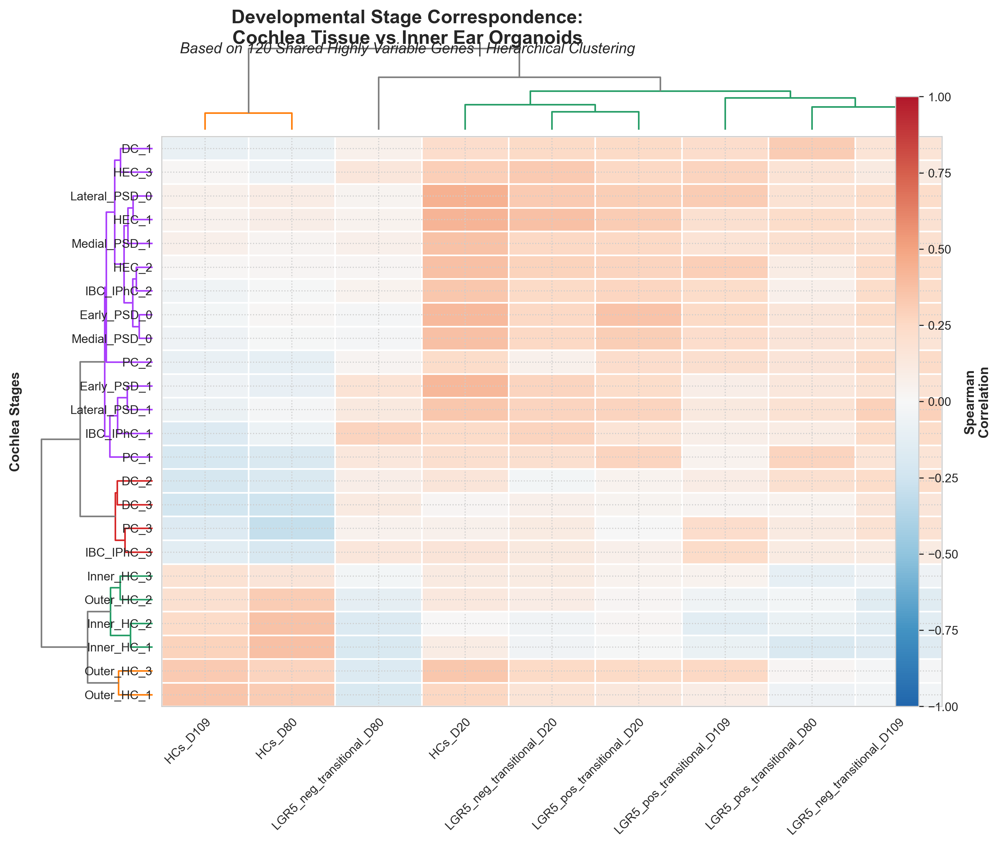


- stage_correspondence_clustered.pdf )
- correlation_matrix.csv 
- best_correspondences.csv 


In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.sparse import issparse
import scipy.stats as stats
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list
from scipy.spatial.distance import pdist, squareform
from matplotlib.colors import LinearSegmentedColormap
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['font.sans-serif'] = ['Arial']
plt.rcParams['font.size'] = 10
plt.rcParams['axes.linewidth'] = 0.8
plt.rcParams['lines.linewidth'] = 1.2
sns.set_style("whitegrid", {'grid.linestyle': ':', 'grid.color': '0.8'})

def get_overdispersed_genes(adata, n_genes=1200):
    
    if issparse(adata.X):
        counts = adata.X.toarray()
    else:
        counts = adata.X
    
    means = np.mean(counts, axis=0)
    variances = np.var(counts, axis=0)
    
    dispersion = variances / means
    dispersion[np.isnan(dispersion)] = 0
    dispersion[np.isinf(dispersion)] = 0
    
    dispersion_df = pd.DataFrame({
        'mean': means,
        'dispersion': dispersion
    }, index=adata.var_names)
    
    dispersion_df = dispersion_df[dispersion_df['mean'] > 0]
    dispersion_df = dispersion_df.sort_values('dispersion', ascending=False)
    
    overdispersed_genes = dispersion_df.head(n_genes).index
    print(f"FIND {len(overdispersed_genes)} GENES")
    return overdispersed_genes

def pseudobulk_per_stage(adata, stage_column, min_cells=5):
    
    
    
    stage_counts = adata.obs[stage_column].value_counts()
    valid_stages = stage_counts[stage_counts >= min_cells].index
    
    
    
    if len(valid_stages) == 0:
        raise ValueError(f"FOUN NO  {min_cells} STAGES")
    
    pseudobulk_data = {}
    for stage in valid_stages:
        stage_cells = adata.obs[stage_column] == stage
        stage_adata = adata[stage_cells]
        
        if issparse(stage_adata.X):
            pseudobulk = np.array(stage_adata.X.sum(axis=0)).flatten()
        else:
            pseudobulk = stage_adata.X.sum(axis=0)
        
        pseudobulk_data[stage] = pseudobulk
    
    pseudobulk_df = pd.DataFrame(pseudobulk_data, index=adata.var_names)
    print(f"pseudobulk GENERATED: {pseudobulk_df.shape}")
    return pseudobulk_df

def normalize_pseudobulk(pseudobulk_df):
    
    
    cpm_matrix = pseudobulk_df.div(pseudobulk_df.sum(axis=0)) * 1e6
    
    
    gene_means = cpm_matrix.mean(axis=1)
    centered_matrix = cpm_matrix.sub(gene_means, axis=0)
    
    return centered_matrix

def transcriptome_correlation_analysis(tissue_adata, organoid_adata, tissue_stage_col, organoid_stage_col):
    
    print("\n" + "="*50)
    
    print("="*50)
    
    
    tissue_hvg = get_overdispersed_genes(tissue_adata, n_genes=1200)
    organoid_hvg = get_overdispersed_genes(organoid_adata, n_genes=1200)
    
    
    tissue_pb = pseudobulk_per_stage(tissue_adata, tissue_stage_col)
    organoid_pb = pseudobulk_per_stage(organoid_adata, organoid_stage_col)
    
   
    shared_hvg = tissue_hvg.intersection(organoid_hvg)
    print(f"shared_hvg: {len(shared_hvg)}")
    
    if len(shared_hvg) == 0:
        raise ValueError("NO shared_hvg")
    
    
    tissue_norm = normalize_pseudobulk(tissue_pb)
    organoid_norm = normalize_pseudobulk(organoid_pb)
    
    
    common_genes = shared_hvg.intersection(tissue_norm.index).intersection(organoid_norm.index)
    tissue_sub = tissue_norm.loc[common_genes]
    organoid_sub = organoid_norm.loc[common_genes]
    
    print(f"common_genes: {len(common_genes)}")
    
    
    corr_matrix = np.zeros((tissue_sub.shape[1], organoid_sub.shape[1]))
    for i in range(tissue_sub.shape[1]):
        for j in range(organoid_sub.shape[1]):
            corr_matrix[i, j], _ = stats.spearmanr(
                tissue_sub.iloc[:, i], 
                organoid_sub.iloc[:, j]
            )
    
    
    corr_df = pd.DataFrame(
        corr_matrix,
        index=tissue_pb.columns,
        columns=organoid_pb.columns
    )
    
    return corr_df, len(shared_hvg)

def perform_clustering(corr_matrix, row_labels, col_labels):
    
    
    row_dist = 1 - corr_matrix  
    row_linkage = linkage(pdist(row_dist), method='average')
    row_order = leaves_list(row_linkage)
    
    
    col_dist = 1 - corr_matrix.T 
    col_linkage = linkage(pdist(col_dist), method='average')
    col_order = leaves_list(col_linkage)
    
   
    clustered_matrix = corr_matrix.iloc[row_order, col_order]
    
    return clustered_matrix, row_order, col_order, row_linkage, col_linkage

def plot_publication_quality_heatmap(corr_matrix, n_genes, figsize=(10, 8)):
    
    fig, ax = plt.subplots(figsize=figsize)
    
    
    colors = ['#2166ac', '#4393c3', '#92c5de', '#d1e5f0', '#f7f7f7', 
              '#fddbc7', '#f4a582', '#d6604d', '#b2182b']
    cmap = LinearSegmentedColormap.from_list('custom_rdbu', colors, N=256)
    
   
    im = ax.imshow(corr_matrix.values, cmap=cmap, aspect='auto', 
                   vmin=-1, vmax=1, origin='lower', 
                   interpolation='nearest')
    
    
    ax.set_xticks(np.arange(len(corr_matrix.columns)))
    ax.set_yticks(np.arange(len(corr_matrix.index)))
    
    
    xtick_labels = [str(x) for x in corr_matrix.columns]
    ytick_labels = [str(y) for y in corr_matrix.index]
    
    ax.set_xticklabels(xtick_labels, rotation=45, ha='right', 
                       rotation_mode='anchor', fontsize=9)
    ax.set_yticklabels(ytick_labels, fontsize=9)
    
    
    ax.set_xlabel('Organoid Developmental Stages', fontsize=11, labelpad=12, fontweight='bold')
    ax.set_ylabel('Cochlea Tissue Stages', fontsize=11, labelpad=12, fontweight='bold')

    ax.set_xticks(np.arange(-0.5, len(corr_matrix.columns)), minor=True)
    ax.set_yticks(np.arange(-0.5, len(corr_matrix.index)), minor=True)
    ax.grid(which="minor", color="white", linestyle='-', linewidth=1.5)
    ax.tick_params(which="minor", size=0)
    
    
    if corr_matrix.shape[0] <= 12 and corr_matrix.shape[1] <= 12:
        for i in range(len(corr_matrix.index)):
            for j in range(len(corr_matrix.columns)):
                color = 'white' if abs(corr_matrix.iloc[i, j]) > 0.5 else 'black'
                text = ax.text(j, i, f'{corr_matrix.iloc[i, j]:.2f}',
                              ha="center", va="center", color=color, 
                              fontsize=8, fontweight='bold')
    
    
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=0.1)
    cbar = plt.colorbar(im, cax=cax)
    cbar.set_label('Spearman Correlation', fontsize=10, fontweight='bold')
    cbar.ax.tick_params(labelsize=9)
    
  
    ax.set_title('Developmental Stage Correspondence:\nCochlea Tissue vs Inner Ear Organoids', 
                 fontsize=13, fontweight='bold', pad=20)
    
   
    ax.text(0.5, 1.02, f'Based on {n_genes} Shared Highly Variable Genes', 
            transform=ax.transAxes, ha='center', fontsize=10, style='italic')
    
    
    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_color('black')
    
    plt.tight_layout()
    return fig

def plot_clustered_heatmap_pdf(corr_matrix, n_genes, figsize=(12, 9)):
    
    clustered_corr, row_order, col_order, row_linkage, col_linkage = perform_clustering(
        corr_matrix, corr_matrix.index.tolist(), corr_matrix.columns.tolist())
    
   
    fig = plt.figure(figsize=figsize)
    
   
    gs = plt.GridSpec(2, 2, width_ratios=[0.15, 1], height_ratios=[0.15, 1], 
                      wspace=0.02, hspace=0.02)
    
    
    colors = ['#2166ac', '#4393c3', '#92c5de', '#d1e5f0', '#f7f7f7', 
              '#fddbc7', '#f4a582', '#d6604d', '#b2182b']
    cmap = LinearSegmentedColormap.from_list('custom_rdbu', colors, N=256)
    
    
    ax1 = fig.add_subplot(gs[1, 0])
    dendrogram(row_linkage, orientation='left', 
               labels=clustered_corr.index.tolist(),
               color_threshold=0.5*max(row_linkage[:, 2]),
               above_threshold_color='gray',
               ax=ax1)
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)
    ax1.spines['bottom'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.set_ylabel('Cochlea Stages', fontsize=10, fontweight='bold', labelpad=10)
    
    
    ax2 = fig.add_subplot(gs[0, 1])
    dendrogram(col_linkage, orientation='top', 
               labels=clustered_corr.columns.tolist(),
               color_threshold=0.5*max(col_linkage[:, 2]),
               above_threshold_color='gray',
               ax=ax2)
    ax2.set_xticks([])
    ax2.set_yticks([])
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.spines['bottom'].set_visible(False)
    ax2.spines['left'].set_visible(False)
    ax2.set_xlabel('Organoid Stages', fontsize=10, fontweight='bold', labelpad=10)
    
    
    ax3 = fig.add_subplot(gs[1, 1])
    im = ax3.imshow(clustered_corr.values, cmap=cmap, aspect='auto', 
                   vmin=-1, vmax=1, origin='lower', 
                   interpolation='nearest')
    
    
    ax3.set_xticks(np.arange(len(clustered_corr.columns)))
    ax3.set_yticks(np.arange(len(clustered_corr.index)))
    ax3.set_xticklabels([str(x) for x in clustered_corr.columns], 
                       rotation=45, ha='right', rotation_mode='anchor', fontsize=9)
    ax3.set_yticklabels([str(y) for y in clustered_corr.index], fontsize=9)
    
    
    ax3.set_xticks(np.arange(-0.5, len(clustered_corr.columns)), minor=True)
    ax3.set_yticks(np.arange(-0.5, len(clustered_corr.index)), minor=True)
    ax3.grid(which="minor", color="white", linestyle='-', linewidth=1.2)
    ax3.tick_params(which="minor", size=0)
    
   
    if clustered_corr.shape[0] <= 15 and clustered_corr.shape[1] <= 15:
        for i in range(len(clustered_corr.index)):
            for j in range(len(clustered_corr.columns)):
                color = 'white' if abs(clustered_corr.iloc[i, j]) > 0.5 else 'black'
                text = ax3.text(j, i, f'{clustered_corr.iloc[i, j]:.2f}',
                              ha="center", va="center", color=color, 
                              fontsize=8, fontweight='bold')
    
    
    cax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    cbar = plt.colorbar(im, cax=cax)
    cbar.set_label('Spearman\nCorrelation', fontsize=10, fontweight='bold')
    cbar.ax.tick_params(labelsize=9)
    
    
    plt.suptitle('Developmental Stage Correspondence:\nCochlea Tissue vs Inner Ear Organoids', 
                 fontsize=14, fontweight='bold', y=0.95)
    
    
    fig.text(0.5, 0.90, f'Based on {n_genes} Shared Highly Variable Genes | Hierarchical Clustering', 
             ha='center', fontsize=11, style='italic')
    
    return fig

def find_best_correspondences(corr_matrix):
    
    print("\n" + "="*50)
    
    print("="*50)
    
    correspondences = []
    
   
    for organoid_stage in corr_matrix.columns:
        best_tissue = corr_matrix[organoid_stage].idxmax()
        best_corr = corr_matrix[organoid_stage].max()
        correspondences.append({
            'Organoid_Stage': organoid_stage,
            'Cochlea_Stage': best_tissue,
            'Correlation': best_corr,
            'Correlation_Level': 'High' if best_corr > 0.7 else 'Medium' if best_corr > 0.4 else 'Low'
        })
        print(f"Organoid {organoid_stage} → Cochlea {best_tissue} (r = {best_corr:.3f})")
    
    return pd.DataFrame(correspondences)

def optimized_simple_analysis(tissue_adata, organoid_adata,
                             tissue_stage_col='cell_type_final_v5_age',
                             organoid_stage_col='cell_type_final_v5_age',
                             use_clustering=True,
                             output_format='pdf'):
    
    print("=" * 60)
   
    print("=" * 60)
    
   
    corr_df, n_genes = transcriptome_correlation_analysis(
        tissue_adata, organoid_adata, tissue_stage_col, organoid_stage_col)
    
    print(f"\n: {corr_df.shape}")
    print(": {:.3f} TO {:.3f}".format(corr_df.values.min(), corr_df.values.max()))
    
    
    if use_clustering and corr_df.shape[0] > 1 and corr_df.shape[1] > 1:
        
        fig = plot_clustered_heatmap_pdf(corr_df, n_genes)
        output_filename = 'stage_correspondence_clustered'
    else:
       
        fig = plot_publication_quality_heatmap(corr_df, n_genes)
        output_filename = 'stage_correspondence_simple'
    
   
    correspondences_df = find_best_correspondences(corr_df)
    

    if output_format.lower() == 'pdf':
        fig.savefig(f'{output_filename}.pdf', dpi=300, bbox_inches='tight', 
                   format='pdf', transparent=False)
        print(f"✓ SAVE {output_filename}.pdf")
    else:
        fig.savefig(f'{output_filename}.png', dpi=300, bbox_inches='tight')
        print(f"✓ SAVE {output_filename}.png")
    
   
    corr_df.to_csv('correlation_matrix.csv')
    correspondences_df.to_csv('best_correspondences.csv', index=False)
    
    print(f"\n✓ : correlation_matrix.csv")
    print(f"✓ : best_correspondences.csv")
    
    plt.show()
    
    return fig, corr_df, correspondences_df

# 主执行函数
def main_optimized_analysis():
    
  
    
 
    fig, corr_matrix, correspondences = optimized_simple_analysis(
        tissue_coe, organoid_coe,
        tissue_stage_col='cell_type_final_v5_age',
        organoid_stage_col='cell_type_final_v5_age',
        use_clustering=True,  
        output_format='pdf'   
    )
    
    print("\n" + "="*60)
    
    print("="*60)
    
    print("- stage_correspondence_clustered.pdf )")
    print("- correlation_matrix.csv ")
    print("- best_correspondences.csv ")
    
    return fig, corr_matrix, correspondences

# 运行分析
if __name__ == "__main__":
    fig, corr_matrix, correspondences = main_optimized_analysis()

In [8]:
organoid_coe

AnnData object with n_obs × n_vars = 2400 × 27444
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final_v4', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0', 'cell_type_final_v5', 'devtime', 'subclasses', 'leiden_scanvi_1.2', 'cell_type_final_v5_age', 'age_bins'
    var: 'gene_ids-0-0', 'feature_types-0-0', 'Gene-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'highly_variable-0-0', 'means-0-0', 'dispersions-0-0', 'dis

### cell proportion 

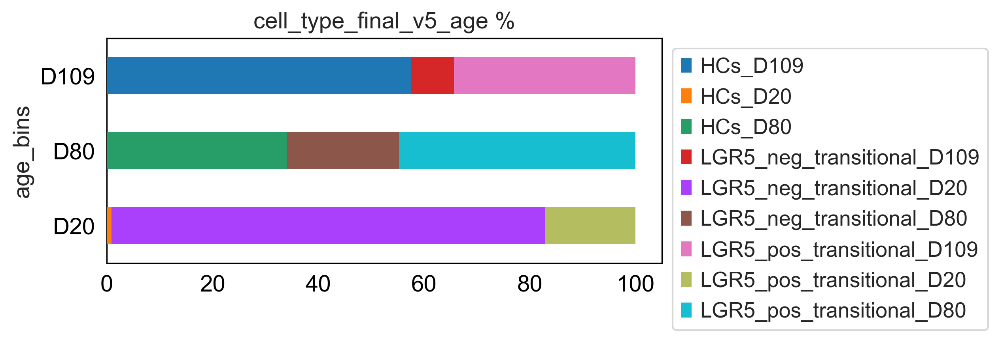

In [14]:
sc.set_figure_params(frameon=False,dpi=150,dpi_save=600)
Barplot('cell_type_final_v5_age', organoid_coe, var='age_bins', height=2.5,
       )
plt.savefig (data_dir+"figures/figure6_and_S13/Barplot_cell_type_porprotion_age_bins_ORGANOIDS.pdf", format="pdf", bbox_inches="tight")

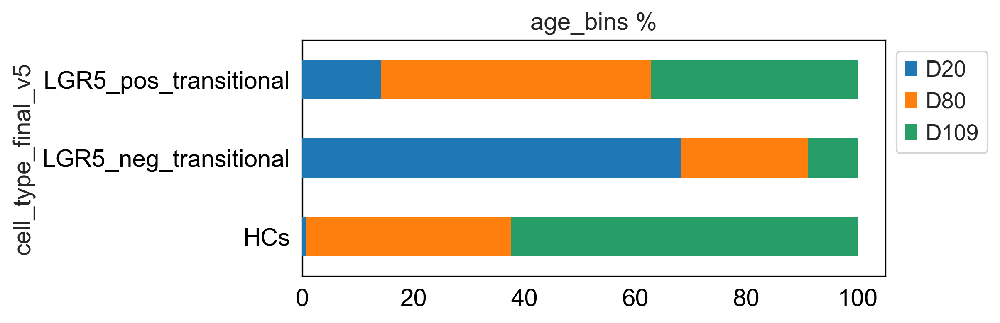

In [15]:
sc.set_figure_params(frameon=False,dpi=150,dpi_save=600)
Barplot('age_bins', organoid_coe, var='cell_type_final_v5', height=2.5,
       )
plt.savefig (data_dir+"figures/figure6_and_S13/Barplot_cell_type_porprotion_ORGANOIDS.pdf", format="pdf", bbox_inches="tight")

<Figure size 2250x1200 with 0 Axes>

<Axes: xlabel='age_bins', ylabel='cell_type_final_v5'>

Text(0.5, 1.0, 'integration → Batch1')

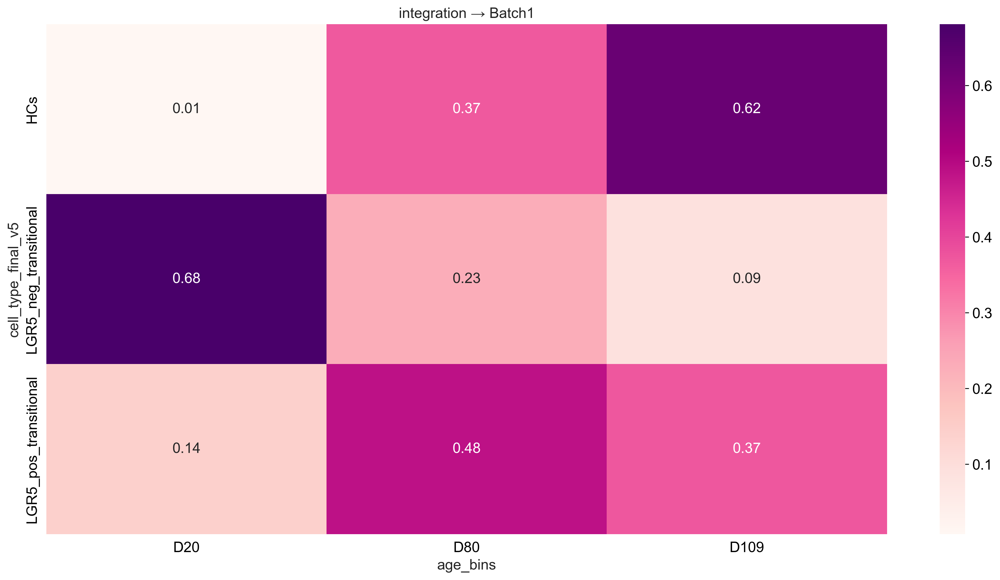

In [16]:
plt.figure(figsize=(15, 8))
ct_b1 = pd.crosstab(
    organoid_coe.obs['cell_type_final_v5'],
    organoid_coe.obs['age_bins'],
    normalize='index'
)
sns.heatmap(ct_b1, cmap="RdPu", annot=True, fmt=".2f")
plt.title("integration → Batch1")

plt.tight_layout()
# 保存为PDF
pdf_path = data_dir+'figures/figure6_and_S13/cell_enrichment_organoids.pdf'
plt.savefig(pdf_path, format='pdf', dpi=600, bbox_inches='tight')
plt.show()

In [17]:

def calculate_enrichment(adata, cluster_key, tissue_key, min_cells=10):
    
    tissues = adata.obs[tissue_key].unique()
    clusters = adata.obs[cluster_key].unique()
    
    
    enrichment_matrix = pd.DataFrame(index=clusters, columns=tissues)
    
   
    global_prop = adata.obs[cluster_key].value_counts(normalize=True)
    
    for tissue in tissues:
      
        tissue_cells = adata[adata.obs[tissue_key] == tissue]
        
       
        if len(tissue_cells) < min_cells:
            continue
            
        tissue_prop = tissue_cells.obs[cluster_key].value_counts(normalize=True)
        
        
        for cluster in clusters:
            obs = tissue_prop.get(cluster, 0)
            exp = global_prop.get(cluster, 0)
            if exp > 0:
                enrichment = np.log1p(obs / exp)
            else:
                enrichment = 0
            enrichment_matrix.loc[cluster, tissue] = enrichment
    
    return enrichment_matrix


<Figure size 1500x1200 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'Cell State Enrichment Across Tissues')

Text(0.5, 129.08333333333334, 'Tissue')

Text(219.08333333333331, 0.5, 'Cell State')

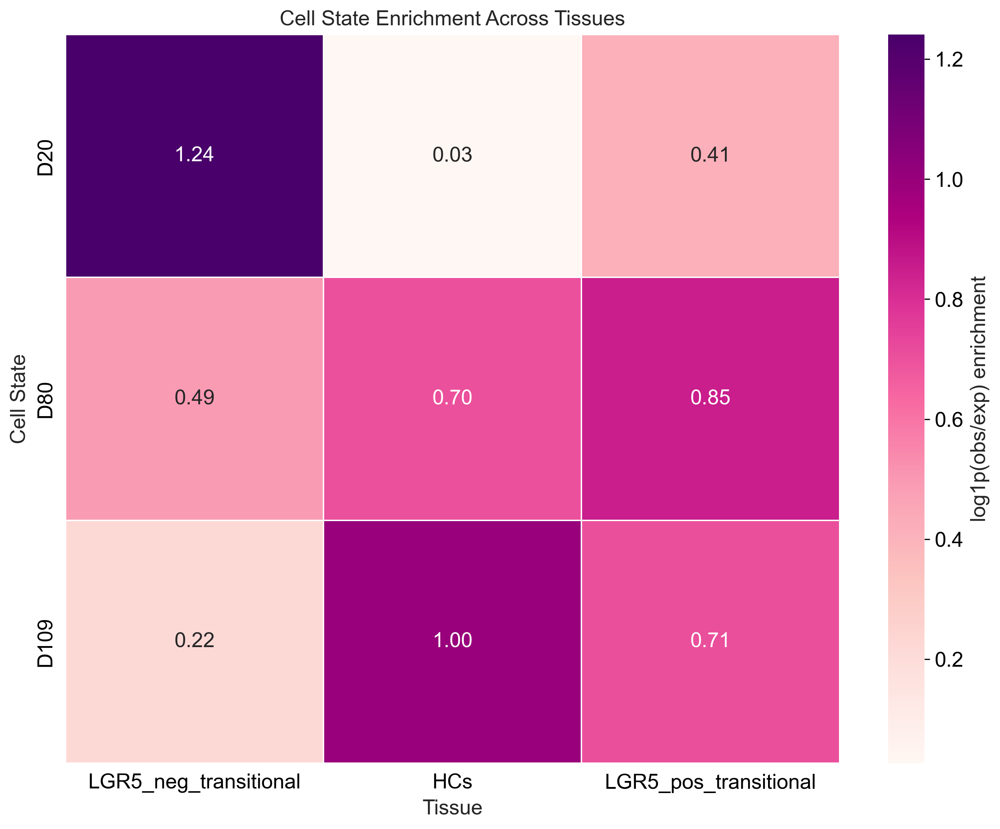

In [18]:

enrichment = calculate_enrichment(organoid_coe, 'age_bins', 'cell_type_final_v5', min_cells=10)



enrichment = enrichment.apply(pd.to_numeric, errors='coerce') 


if enrichment.isnull().any().any():
    
    print(enrichment.isnull().sum())


enrichment = enrichment.fillna(0)


plt.figure(figsize=(10, 8))
sns.heatmap(
    enrichment,
    cmap='RdPu',
    linewidths=0.5,
    annot=True,
    fmt=".2f",
    cbar_kws={'label': 'log1p(obs/exp) enrichment'}
)
plt.title('Cell State Enrichment Across Tissues')
plt.xlabel('Tissue')
plt.ylabel('Cell State')
plt.tight_layout()


pdf_path = data_dir+'figures/figure6_and_S13/cell_enrichment_heatmap_organoids.pdf'
plt.savefig(pdf_path, format='pdf', dpi=600, bbox_inches='tight')



plt.show()

In [19]:
include_clusters = ['HCs_D20','HCs_D80','HCs_D109']
organoid_coe_hc= organoid_coe[organoid_coe.obs['cell_type_final_v5_age'].isin(include_clusters), :]
organoid_coe_hc

View of AnnData object with n_obs × n_vars = 800 × 27444
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final_v4', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0', 'cell_type_final_v5', 'devtime', 'subclasses', 'leiden_scanvi_1.2', 'cell_type_final_v5_age', 'age_bins'
    var: 'gene_ids-0-0', 'feature_types-0-0', 'Gene-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'highly_variable-0-0', 'means-0-0', 'dispersions-0-0

### FIGURE6d/e

#### marker gene plot

In [20]:
sc.pp.normalize_total(organoid_coe_hc, target_sum=1e4)
sc.pp.log1p(organoid_coe_hc)

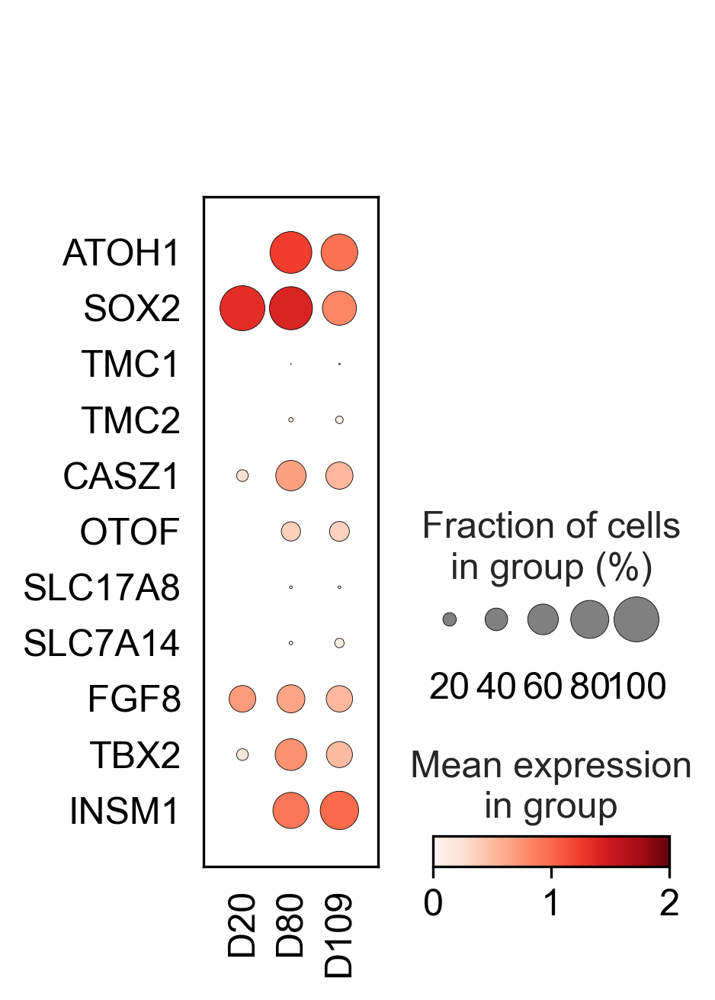

In [21]:
# List of genes to plot
genes1 = ['ATOH1', 'SOX2', 
         'TMC1','TMC2','CASZ1',
          'OTOF','SLC17A8','SLC7A14','FGF8',
         'TBX2', 'INSM1']#'CASZ1', UNDETECTED IN P21 IHC
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.dotplot(organoid_coe_hc, var_names=genes1, groupby='age_bins', swap_axes=True,
            vmax=2)#standard_scale='var'

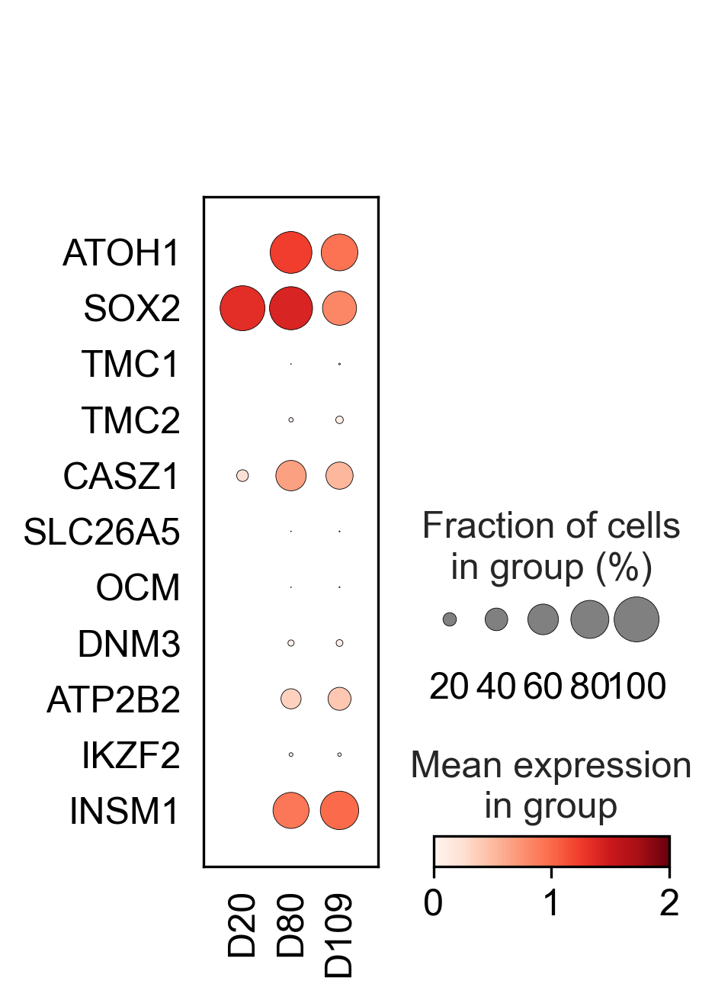

In [22]:
genes2 = ['ATOH1', 'SOX2', 
         'TMC1','TMC2','CASZ1',
          'SLC26A5','OCM','DNM3','ATP2B2',
         'IKZF2', 'INSM1']#'CASZ1',
sc.pl.dotplot(organoid_coe_hc, var_names=genes2, groupby='devtime',swap_axes=True,
             vmax=2)#standard_scale='var'

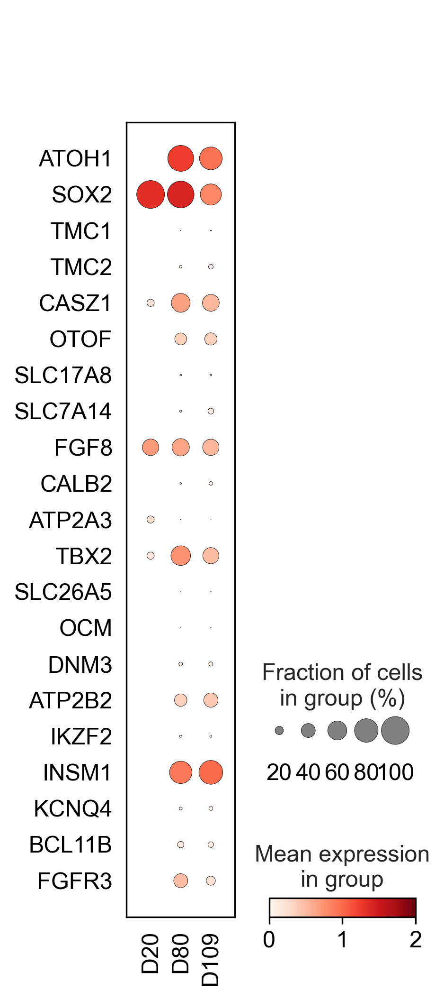

In [23]:
# List of genes to plot
genes3 = ['ATOH1', 'SOX2', 
         'TMC1','TMC2','CASZ1',
          'OTOF','SLC17A8','SLC7A14','FGF8','CALB2','ATP2A3',
         'TBX2',  'SLC26A5','OCM','DNM3','ATP2B2',
         'IKZF2', 'INSM1','KCNQ4','BCL11B','FGFR3'
        
        
        
        ]#'CASZ1', UNDETECTED IN P21 IHC
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.dotplot(organoid_coe_hc, var_names=genes3, groupby='age_bins', swap_axes=True,
            vmax=2)#standard_scale='var'

In [24]:
include_clusters = ['Inner_HC_1','Inner_HC_2','Inner_HC_3',]
tissue_coe_ihc= tissue_coe[tissue_coe.obs['cell_type_final_v5_age'].isin(include_clusters), :]
tissue_coe_ihc
include_clusters = ['Outer_HC_1','Outer_HC_2','Outer_HC_3']
tissue_coe_ohc= tissue_coe[tissue_coe.obs['cell_type_final_v5_age'].isin(include_clusters), :]
tissue_coe_ohc

View of AnnData object with n_obs × n_vars = 116 × 27444
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final_v4', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0', 'cell_type_final_v5', 'devtime', 'subclasses', 'leiden_scanvi_1.2', 'gestational_week', 'age_bins', 'cell_type_final_v5_age'
    var: 'gene_ids-0-0', 'feature_types-0-0', 'Gene-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'highly_variable-0-0', 'means-0-

View of AnnData object with n_obs × n_vars = 94 × 27444
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final_v4', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0', 'cell_type_final_v5', 'devtime', 'subclasses', 'leiden_scanvi_1.2', 'gestational_week', 'age_bins', 'cell_type_final_v5_age'
    var: 'gene_ids-0-0', 'feature_types-0-0', 'Gene-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'highly_variable-0-0', 'means-0-0

In [25]:
sc.pp.normalize_total(tissue_coe_ihc, target_sum=1e4)
sc.pp.log1p(tissue_coe_ihc)
sc.pp.normalize_total(tissue_coe_ohc, target_sum=1e4)
sc.pp.log1p(tissue_coe_ohc)

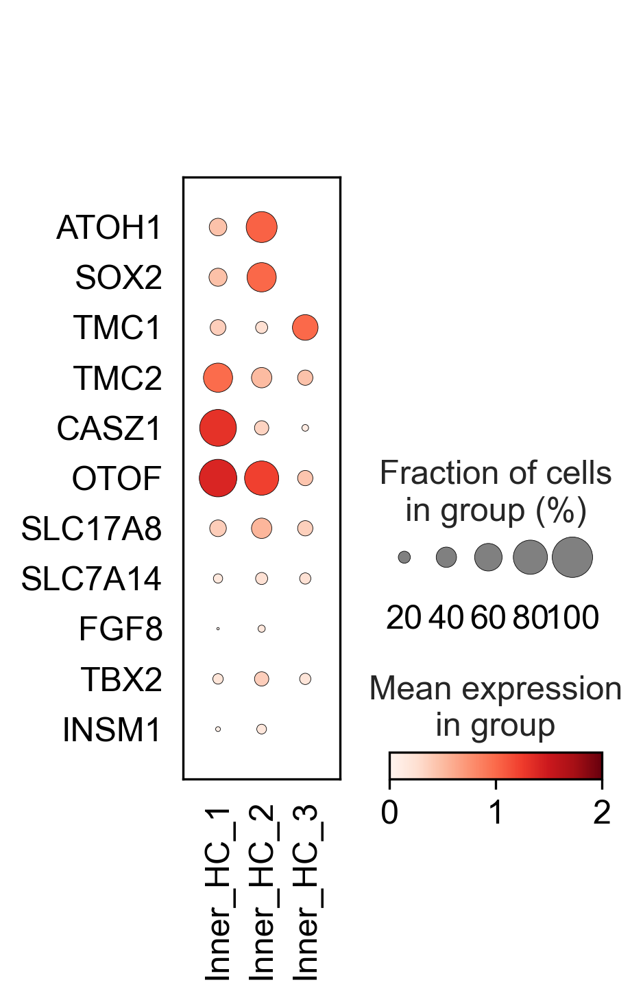

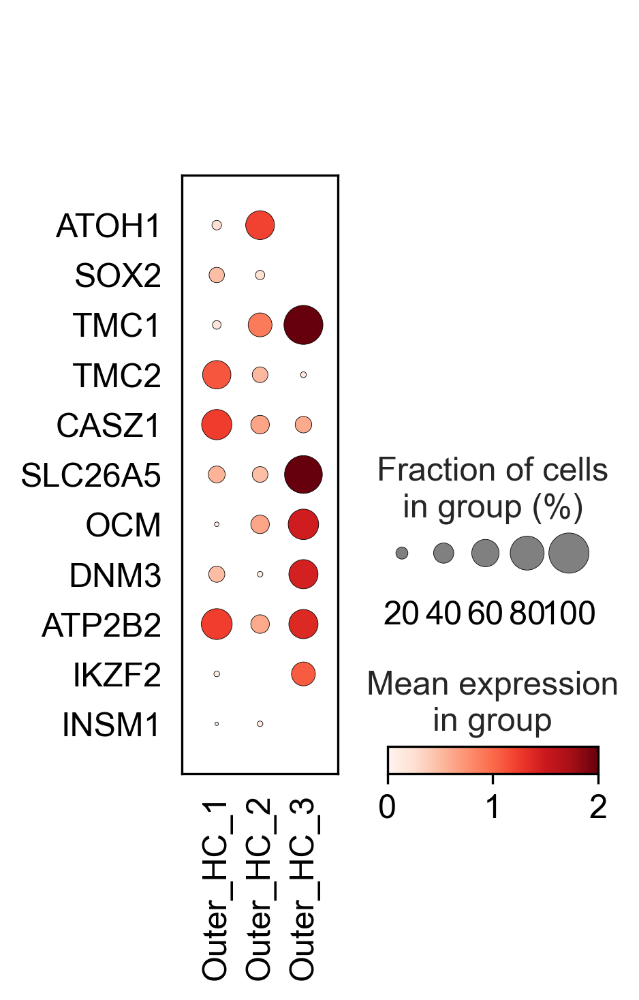

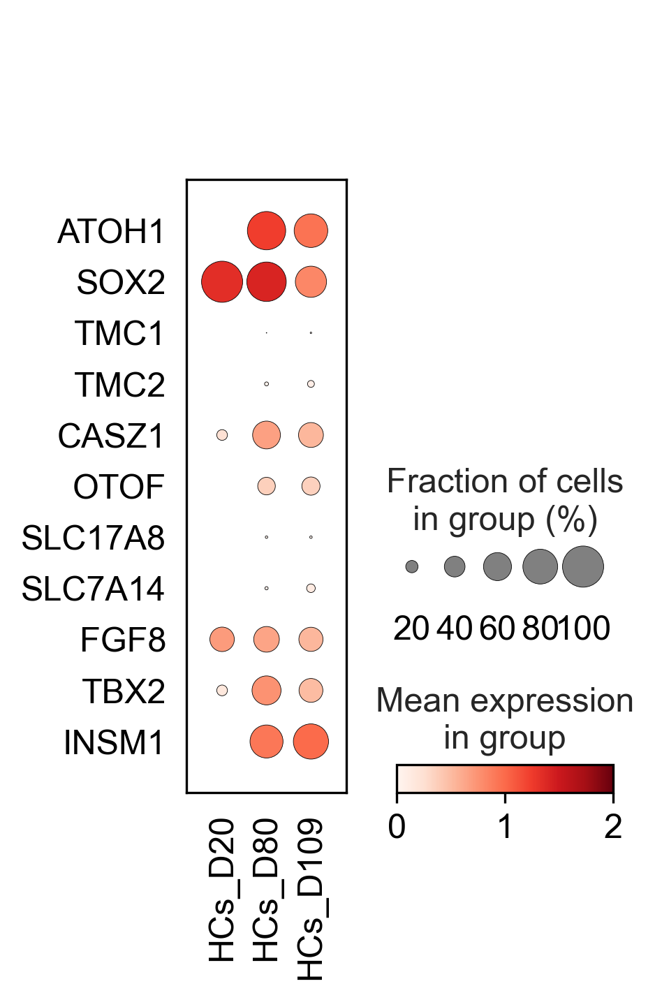

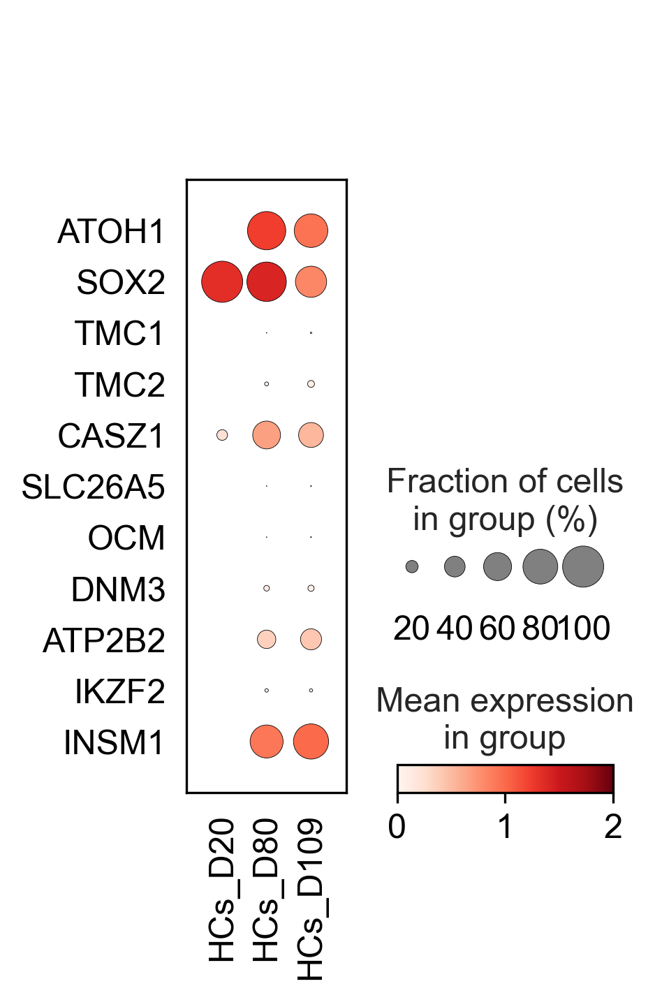

In [26]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.dotplot(tissue_coe_ihc, var_names=genes1, groupby='cell_type_final_v5_age', swap_axes=True,
              save="_human_inner_hc_comparison.pdf",
            vmax=2)#standard_scale='var'
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.dotplot(tissue_coe_ohc, var_names=genes2, groupby='cell_type_final_v5_age', swap_axes=True,
              save="_human_outer_hc_comparison.pdf",
            vmax=2)#standard_scale='var'
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.dotplot(organoid_coe_hc, var_names=genes1, groupby='cell_type_final_v5_age', swap_axes=True,
              save="_organoids_ihc_comparison.pdf",
            vmax=2)#standard_scale='var'
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.dotplot(organoid_coe_hc, var_names=genes2, groupby='cell_type_final_v5_age', swap_axes=True,
              save="_organoids_ohc_comparison.pdf",
            vmax=2)#standard_scale='var'

In [35]:

import re
def strict_gene_filter(adata, inplace=True):
   
    if not inplace:
        adata = adata.copy()
    
    all_genes = adata.var_names.tolist()
    
    
    patterns_to_remove = [
       
        re.compile(r'^RP[SL]\d|^RPL|^RPS|^MRPL|^MRPS', re.IGNORECASE),
        
        re.compile(r'^MT-|^MT\.|^MTRNR', re.IGNORECASE),
        
        re.compile(r'^HB[ABDEGMQSTZ]|^HBA|^HBB|^HBD|^HBE', re.IGNORECASE),
       
        re.compile(r'^IG[HKL][VJC]|^TR[ABGD][VCJ]', re.IGNORECASE),
        
        re.compile(r'^NPM1|^FBL|^NOP', re.IGNORECASE),
    ]
    
    
    extended_cell_cycle = [
        'MCM5', 'PCNA', 'TYMS', 'FEN1', 'MCM2', 'MCM4', 'RRM1', 'UNG', 'GINS2', 'MCM6',
        'CDCA7', 'DTL', 'PRIM1', 'UHRF1', 'CENPU', 'HELLS', 'RFC2', 'RPA2', 'NASP',
        'RAD51AP1', 'GMNN', 'WDR76', 'SLBP', 'CCNE2', 'UBR7', 'POLD3', 'MSH2', 'ATAD2',
        'RAD51', 'RRM2', 'CDC45', 'CDC6', 'EXO1', 'TIPIN', 'DSCC1', 'BLM', 'CASP8AP2',
        'USP1', 'CLSPN', 'POLA1', 'CHAF1B', 'BRIP1', 'E2F8', 'HMGB2', 'CDK1', 'NUSAP1',
        'UBE2C', 'BIRC5', 'TPX2', 'TOP2A', 'NDC80', 'CKS2', 'NUF2', 'CKS1B', 'MKI67',
        'TMPO', 'CENPF', 'TACC3', 'FAM64A', 'SMC4', 'CCNB2', 'CKAP2L', 'CKAP2', 'AURKB',
        'BUB1', 'KIF11', 'ANP32E', 'TUBB4B', 'GTSE1', 'KIF20B', 'HJURP', 'CDCA3', 'JPT1',
        'CDC20', 'TTK', 'CDC25C', 'KIF2C', 'RANGAP1', 'NCAPD2', 'DLGAP5', 'CDCA2', 'CDCA8',
        'ECT2', 'KIF23', 'HMMR', 'AURKA', 'PSRC1', 'ANLN', 'LBR', 'CKAP5', 'CENPE', 'CTCF',
        'NEK2', 'G2E3', 'GAS2L3', 'CBX5', 'CENPA',
        
        'CCNA2', 'CCNB1', 'CCND1', 'CCNE1', 'CDK2', 'CDK4', 'CDK6', 'E2F1', 'E2F2', 'E2F3','XIST',
    ]
    
    genes_to_keep = []
    genes_to_remove = []
    
    for gene in all_genes:
        gene_upper = gene.upper()
        should_remove = False
        
        
        for pattern in patterns_to_remove:
            if pattern.match(gene):
                should_remove = True
                break
        
       
        if not should_remove and gene_upper in extended_cell_cycle:
            should_remove = True
        
        if should_remove:
            genes_to_remove.append(gene)
        else:
            genes_to_keep.append(gene)
    
   
    print(f"original gene num: {len(all_genes)}")
    print(f"genes removed: {len(genes_to_remove)}")
    print(f"gens kept: {len(genes_to_keep)}")
    
    
    if inplace:
        adata._inplace_subset_var(genes_to_keep)
        return None
    else:
        return adata[:, genes_to_keep].copy()


print("filtering...")
tissue_coe_hc_strict = strict_gene_filter(tissue_coe_hc, inplace=False)
organoid_coe_hc_strict = strict_gene_filter(organoid_coe_hc, inplace=False)
tissue_coe_ihc_strict = strict_gene_filter(tissue_coe_ihc, inplace=False)
tissue_coe_ohc_strict = strict_gene_filter(tissue_coe_ohc, inplace=False)
tissue_coe_strict = strict_gene_filter(tissue_coe, inplace=False)
organoid_coe_strict = strict_gene_filter(organoid_coe, inplace=False)

filtering...
original gene num: 27444
genes removed: 352
gens kept: 27092
original gene num: 27444
genes removed: 352
gens kept: 27092
original gene num: 27444
genes removed: 352
gens kept: 27092
original gene num: 27444
genes removed: 352
gens kept: 27092
original gene num: 27444
genes removed: 352
gens kept: 27092
original gene num: 27444
genes removed: 352
gens kept: 27092


In [36]:
include_clusters = ['Inner_HC_1','Inner_HC_2','Inner_HC_3','Outer_HC_1','Outer_HC_2','Outer_HC_3']
tissue_coe_hc= tissue_coe[tissue_coe.obs['cell_type_final_v5_age'].isin(include_clusters), :]
tissue_coe_hc
organoid_coe_hc

View of AnnData object with n_obs × n_vars = 210 × 27444
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final_v4', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0', 'cell_type_final_v5', 'devtime', 'subclasses', 'leiden_scanvi_1.2', 'gestational_week', 'age_bins', 'cell_type_final_v5_age'
    var: 'gene_ids-0-0', 'feature_types-0-0', 'Gene-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'highly_variable-0-0', 'means-0-

AnnData object with n_obs × n_vars = 800 × 27444
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final_v4', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0', 'cell_type_final_v5', 'devtime', 'subclasses', 'leiden_scanvi_1.2', 'cell_type_final_v5_age', 'age_bins'
    var: 'gene_ids-0-0', 'feature_types-0-0', 'Gene-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'highly_variable-0-0', 'means-0-0', 'dispersions-0-0', 'disp

In [37]:
# remove HCs_D20 as low cell number 
include_clusters = ['HCs_D80','HCs_D109',]
organoid_coe_hc_d80_d109= organoid_coe_hc[organoid_coe_hc.obs['cell_type_final_v5_age'].isin(include_clusters), :]
organoid_coe_hc_d80_d109

View of AnnData object with n_obs × n_vars = 794 × 27444
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final_v4', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0', 'cell_type_final_v5', 'devtime', 'subclasses', 'leiden_scanvi_1.2', 'cell_type_final_v5_age', 'age_bins'
    var: 'gene_ids-0-0', 'feature_types-0-0', 'Gene-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'highly_variable-0-0', 'means-0-0', 'dispersions-0-0

In [38]:
%run _markers_v2.py

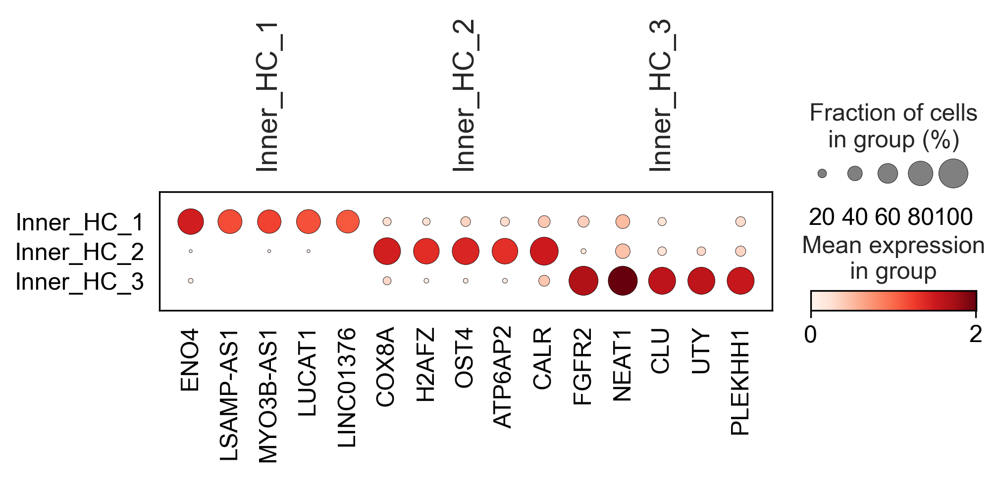

In [39]:
# ihc
mkst_ihc = calc_marker_stats(tissue_coe_ihc_strict, 'cell_type_final_v5_age',use_rep=False,)
mks_ihc = filter_marker_stats(mkst_ihc, max_next_frac=0.2, min_mean_diff=0.3, how='or')
plot_markers(tissue_coe_ihc_strict, 'cell_type_final_v5_age', mks_ihc, )#standard_scale='var',

In [396]:
pd.DataFrame(mks_ihc).to_csv('human_coe_ihc_markers.csv', index=True)

In [414]:
pd.DataFrame(cluster_genes).to_csv('human_coe_ihc_markers_top100.csv', index=True)

### gene-set signiture scoring

In [40]:
print( mks_ihc.columns[0])
cluster = 'Inner_HC_1'
cluster_genes = mks_ihc[mks_ihc['top_frac_group'] == cluster].sort_values('frac_diff', ascending=False).head(100)
gene_list = cluster_genes.index.tolist() #

print(f"Cluster {cluster}: {len(gene_list)}")
sc.tl.score_genes(organoid_coe_hc_d80_d109, gene_list, score_name=f'score_{cluster}')

top_frac_group
Cluster Inner_HC_1: 100


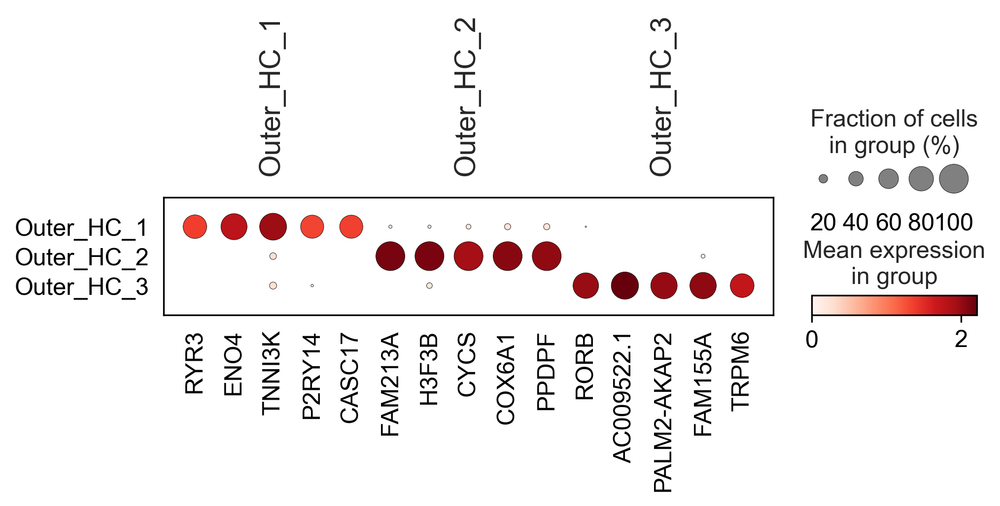

In [44]:
# ohc
mkst_ohc = calc_marker_stats(tissue_coe_ohc_strict, 'cell_type_final_v5_age',use_rep=False,)
mks_ohc = filter_marker_stats(mkst_ohc, max_next_frac=0.2, min_mean_diff=0.3, how='or')
plot_markers(tissue_coe_ohc_strict, 'cell_type_final_v5_age', mks_ohc, )#standard_scale='var',

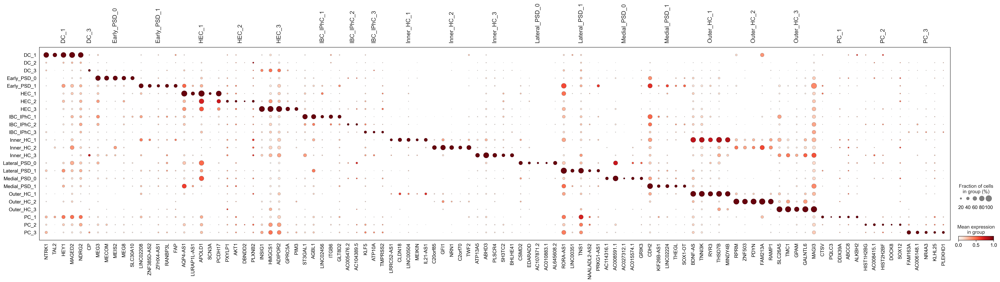

In [45]:
# coe
tissue_coe_strict.obs['cell_type_final_v5_age'] = tissue_coe_strict.obs['cell_type_final_v5_age'].astype('category')
mkst_coe = calc_marker_stats(tissue_coe_strict, 'cell_type_final_v5_age',use_rep=False,)
mks_coe = filter_marker_stats(mkst_coe, max_next_frac=0.2, min_mean_diff=0.3, how='or')
plot_markers(tissue_coe_strict, 'cell_type_final_v5_age', mks_coe,standard_scale='var', )#standard_scale='var',

top_frac_group
Cluster Outer_HC_1:  28 


<Axes: ylabel='score_Outer_HC_1'>

(-0.3, 0.6)

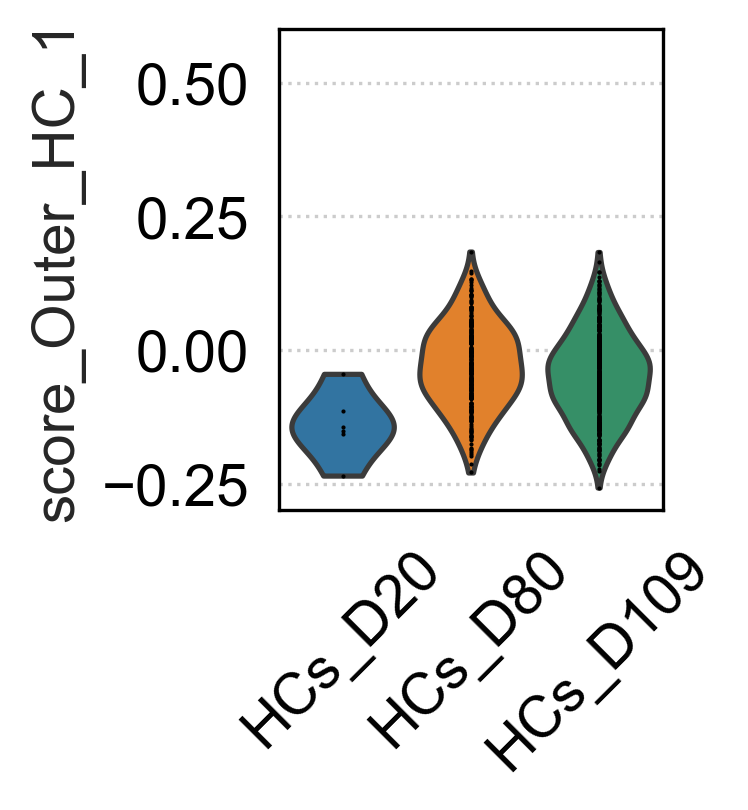

In [46]:

print( mks_ihc.columns[0])


cluster4 = 'Outer_HC_1'
cluster_genes4 = mks_coe[mks_coe['top_frac_group'] == cluster4].sort_values('frac_diff', ascending=False).head(100)
gene_list4 = cluster_genes4.index.tolist() 

print(f"Cluster {cluster4}:  {len(gene_list4)} ")
sc.tl.score_genes(organoid_coe_hc, gene_list4, score_name=f'score_{cluster4}')
import matplotlib.pyplot as plt

sc.set_figure_params(figsize=(2.5,3), frameon=False, dpi=150, dpi_save=600)


fig, ax = plt.subplots(figsize=(2.5, 3))


sc.pl.violin(organoid_coe_hc, ['score_Outer_HC_1'], 
             groupby='cell_type_final_v5_age',
            
             jitter=False, 
             rotation=45,
             ax=ax, 
             show=False  
            )


ax.set_ylim(-0.3, 0.6)


plt.tight_layout()
plt.savefig(data_dir+'figures/figure6_and_S13/organoid_ohc1_score.pdf', dpi=600, bbox_inches='tight')
plt.show()

top_frac_group
Cluster Outer_HC_2:  100 


<Axes: ylabel='score_Outer_HC_2'>

(-0.3, 0.6)

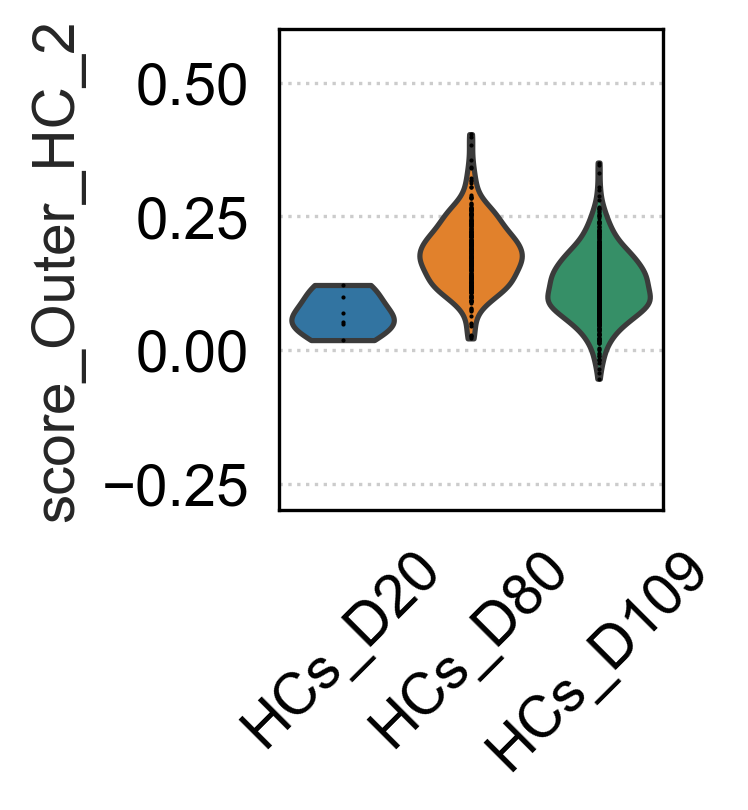

In [47]:

print( mks_ihc.columns[0])


cluster5 = 'Outer_HC_2'
cluster_genes5 = mks_coe[mks_coe['top_frac_group'] == cluster5].sort_values('frac_diff', ascending=False).head(100)
gene_list5 = cluster_genes5.index.tolist() 

print(f"Cluster {cluster5}:  {len(gene_list5)} ")
sc.tl.score_genes(organoid_coe_hc, gene_list5, score_name=f'score_{cluster5}')
import matplotlib.pyplot as plt

sc.set_figure_params(figsize=(2.5,3), frameon=False, dpi=150, dpi_save=600)


fig, ax = plt.subplots(figsize=(2.5, 3))


sc.pl.violin(organoid_coe_hc, ['score_Outer_HC_2'], 
             groupby='cell_type_final_v5_age',
             #order=['HCs_D80', 'HCs_D109'], 
             jitter=False, 
             rotation=45,
             ax=ax,  
             show=False 
            )


ax.set_ylim(-0.3, 0.6)


plt.tight_layout()
plt.savefig(data_dir+'figures/figure6_and_S13/organoid_ohc2_score.pdf', dpi=600, bbox_inches='tight')
plt.show()

top_frac_group
Cluster Outer_HC_3:  71 


<Axes: ylabel='score_Outer_HC_3'>

(-0.3, 0.6)

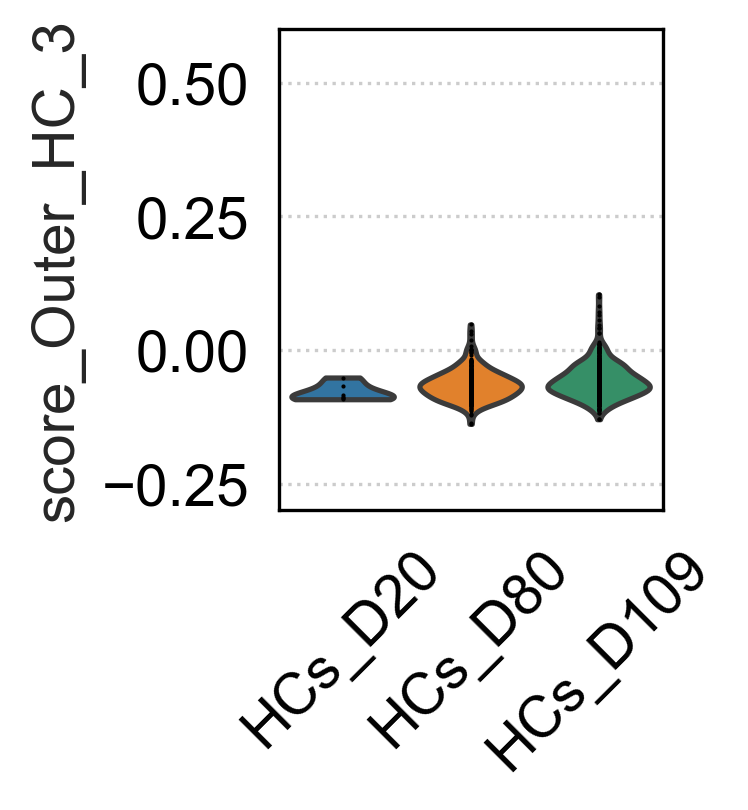

In [48]:
print( mks_ihc.columns[0])


cluster6 = 'Outer_HC_3'
cluster_genes6 = mks_coe[mks_coe['top_frac_group'] == cluster6].sort_values('frac_diff', ascending=False).head(100)
gene_list6 = cluster_genes6.index.tolist()

print(f"Cluster {cluster6}:  {len(gene_list6)} ")
sc.tl.score_genes(organoid_coe_hc, gene_list6, score_name=f'score_{cluster6}')
import matplotlib.pyplot as plt

sc.set_figure_params(figsize=(2.5,3), frameon=False, dpi=150, dpi_save=600)


fig, ax = plt.subplots(figsize=(2.5, 3))


sc.pl.violin(organoid_coe_hc, ['score_Outer_HC_3'], 
             groupby='cell_type_final_v5_age',
             #order=['HCs_D80', 'HCs_D109'], 
             jitter=False, 
             rotation=45,
             ax=ax,  
             show=False  
            )


ax.set_ylim(-0.3, 0.6)

#
plt.tight_layout()
plt.savefig(data_dir+'figures/figure6_and_S13/organoid_ohc3_score.pdf', dpi=600, bbox_inches='tight')
plt.show()


top_frac_group
Cluster Inner_HC_1:  100 


<Axes: ylabel='score_Inner_HC_1'>

(-0.3, 0.6)

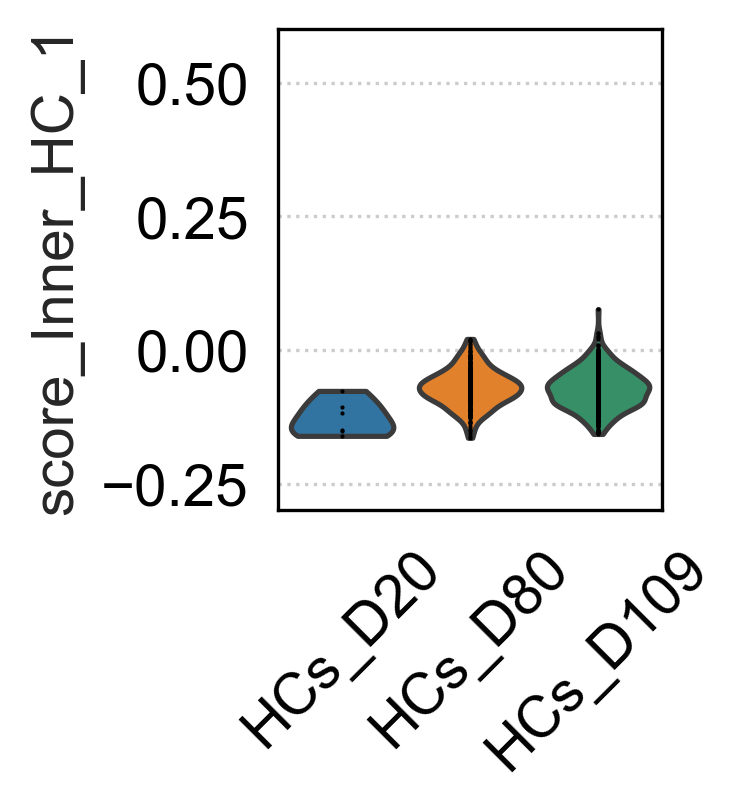

In [52]:

print(mks_ihc.columns[0])


cluster1 = 'Inner_HC_1'
cluster_genes1 = mks_coe[mks_coe['top_frac_group'] == cluster1].sort_values('frac_diff', ascending=False).head(100)
gene_list1 = cluster_genes1.index.tolist() 

print(f"Cluster {cluster1}:  {len(gene_list1)} ")
sc.tl.score_genes(organoid_coe_hc, gene_list1, score_name=f'score_{cluster1}')
import matplotlib.pyplot as plt

sc.set_figure_params(figsize=(2.5,3), frameon=False, dpi=150, dpi_save=600)


fig, ax = plt.subplots(figsize=(2.5, 3))


sc.pl.violin(organoid_coe_hc, ['score_Inner_HC_1'], 
             groupby='cell_type_final_v5_age',
             #order=['HCs_D80', 'HCs_D109'], 
             jitter=False, 
             rotation=45,
             ax=ax,  
             show=False  
            )


ax.set_ylim(-0.3, 0.6)


plt.tight_layout()
plt.savefig(data_dir+'figures/figure6_and_S13/organoid_ihc1_score.pdf', dpi=600, bbox_inches='tight')
plt.show()


top_frac_group
Cluster Inner_HC_2:  100 分


<Axes: ylabel='score_Inner_HC_2'>

(-0.3, 0.6)

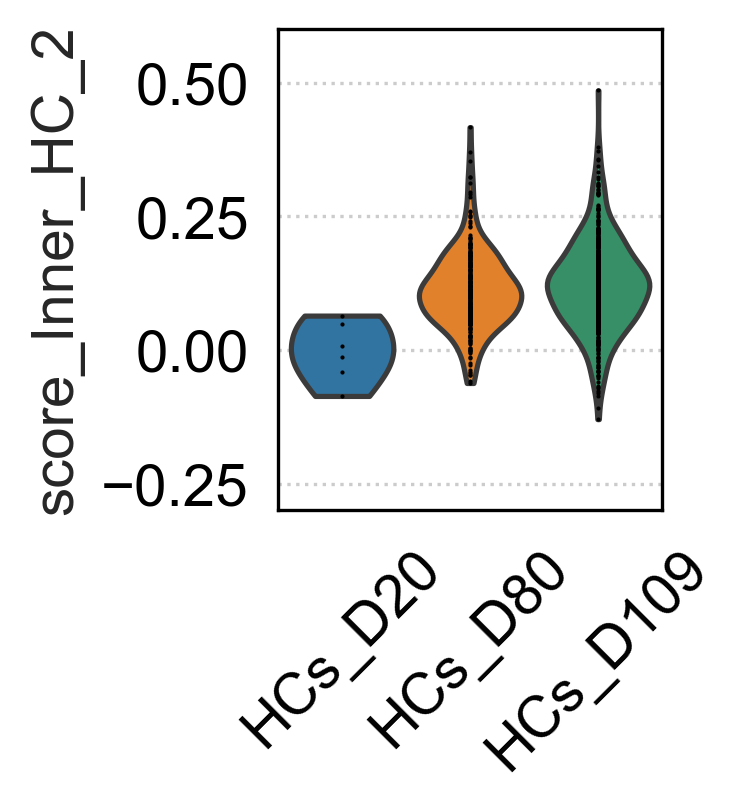

In [50]:

print( mks_ihc.columns[0])


cluster2 = 'Inner_HC_2'
cluster_genes2 = mks_coe[mks_coe['top_frac_group'] == cluster2].sort_values('frac_diff', ascending=False).head(100)
gene_list2 = cluster_genes2.index.tolist() 

print(f"Cluster {cluster2}:  {len(gene_list2)} 分")
sc.tl.score_genes(organoid_coe_hc, gene_list2, score_name=f'score_{cluster2}')
import matplotlib.pyplot as plt

sc.set_figure_params(figsize=(2.5,3), frameon=False, dpi=150, dpi_save=600)


fig, ax = plt.subplots(figsize=(2.5, 3))


sc.pl.violin(organoid_coe_hc, ['score_Inner_HC_2'], 
             groupby='cell_type_final_v5_age',
             #order=['HCs_D80', 'HCs_D109'], 
             jitter=False, 
             rotation=45,
             ax=ax,  
             show=False  
            )


ax.set_ylim(-0.3, 0.6)


plt.tight_layout()
plt.savefig(data_dir+'figures/figure6_and_S13/organoid_ihc2_score.pdf', dpi=600, bbox_inches='tight')
plt.show()


top_frac_group
Cluster Inner_HC_3:  100 


<Axes: ylabel='score_Inner_HC_3'>

(-0.3, 0.6)

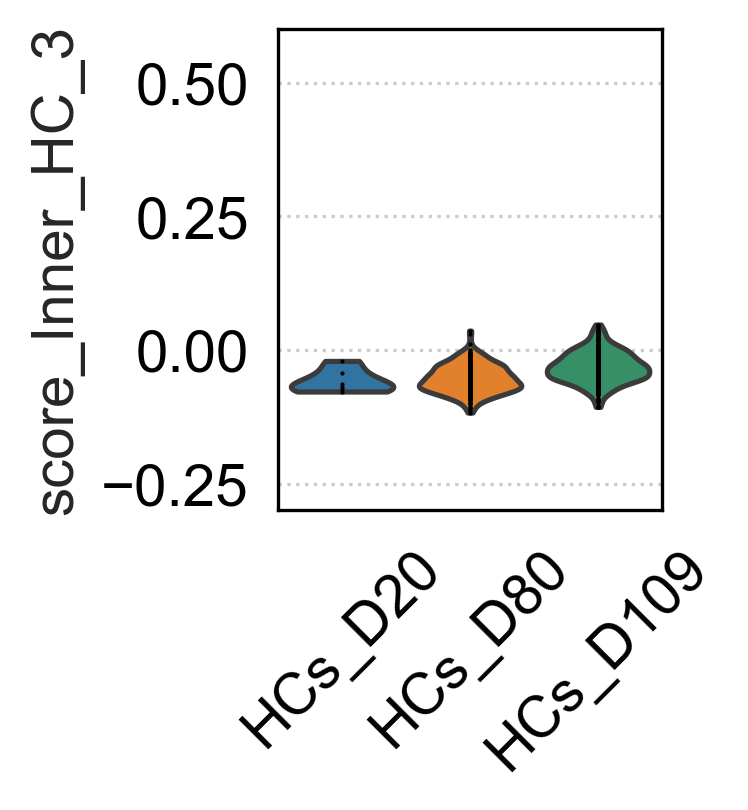

In [57]:

print( mks_ihc.columns[0])


cluster2 = 'Inner_HC_3'
cluster_genes2 = mks_coe[mks_coe['top_frac_group'] == cluster2].sort_values('frac_diff', ascending=False).head(100)
gene_list2 = cluster_genes2.index.tolist() 

print(f"Cluster {cluster2}:  {len(gene_list2)} ")
sc.tl.score_genes(organoid_coe_hc, gene_list2, score_name=f'score_{cluster2}')
import matplotlib.pyplot as plt

sc.set_figure_params(figsize=(2.5,3), frameon=False, dpi=150, dpi_save=600)


fig, ax = plt.subplots(figsize=(2.5, 3))


sc.pl.violin(organoid_coe_hc, ['score_Inner_HC_3'], 
             groupby='cell_type_final_v5_age',
             #order=['HCs_D80', 'HCs_D109'], 
             jitter=False, 
             rotation=45,
             ax=ax,  
             show=False  
            )


ax.set_ylim(-0.3, 0.6)


plt.tight_layout()
plt.savefig(data_dir+'figures/figure6_and_S13/organoid_ihc3_score.pdf', dpi=600, bbox_inches='tight')
plt.show()

In [54]:
# Set the cell type identities
organoid_coe_hc_strict.obs['cell_type_final_v5_age'] = organoid_coe_hc_strict.obs['cell_type_final_v5_age'].astype('category')
tissue_coe_hc_strict.obs['cell_type_final_v5_age'] = tissue_coe_hc_strict.obs['cell_type_final_v5_age'].astype('category')

In [55]:
cluster1

'Inner_HC_1'

### FIGURE6f

### JACCARD INDEX

In [60]:
organoid_coe_hc_d80_d109_strict = strict_gene_filter(organoid_coe_hc_d80_d109, inplace=False)

original gene num: 27444
genes removed: 352
gens kept: 27092


tissue clusters: ['Inner_HC_1', 'Inner_HC_2', 'Inner_HC_3', 'Outer_HC_1', 'Outer_HC_2', 'Outer_HC_3']
Categories (6, object): ['Inner_HC_1', 'Inner_HC_2', 'Inner_HC_3', 'Outer_HC_1', 'Outer_HC_2', 'Outer_HC_3']
organoid clusters: ['HCs_D80', 'HCs_D109']
Categories (2, object): ['HCs_D80', 'HCs_D109']
Jaccard matrix:
             HCs_D80  HCs_D109
Inner_HC_1  0.026405  0.065606
Inner_HC_2  0.042673  0.095585
Inner_HC_3  0.015189  0.057080
Outer_HC_1  0.009390  0.005567
Outer_HC_2  0.038722  0.029851
Outer_HC_3  0.001284  0.011439


<Figure size 1500x1200 with 0 Axes>

[Text(0.5, 0, 'HCs_D80'), Text(1.5, 0, 'HCs_D109')]

[Text(0, 0.5, 'Inner_HC_1'),
 Text(0, 1.5, 'Inner_HC_2'),
 Text(0, 2.5, 'Inner_HC_3'),
 Text(0, 3.5, 'Outer_HC_1'),
 Text(0, 4.5, 'Outer_HC_2'),
 Text(0, 5.5, 'Outer_HC_3')]

Text(0.5, 1.0, 'Jaccard Similarity Between Cell Types\n(Tissue vs Organoid)')

Text(0.5, 129.08333333333334, 'Organoid Cell Types')

Text(851.0833333333334, 0.5, 'Tissue Cell Types')

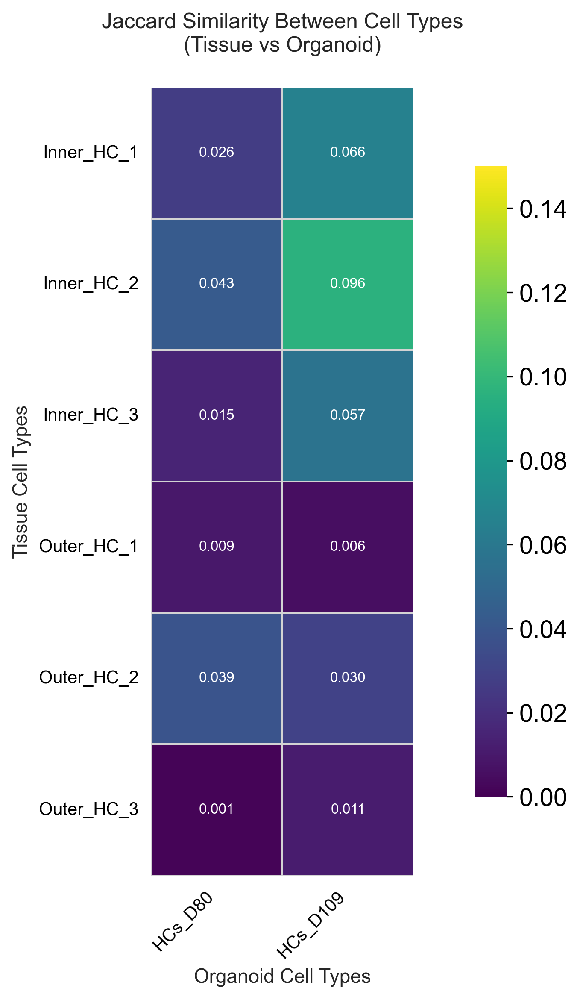

In [61]:
## JACARD INDEX
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Find markers for each cell type
mkst_coe = calc_marker_stats(tissue_coe_hc_strict, 'cell_type_final_v5_age', use_rep=False)
mkst_org = calc_marker_stats(organoid_coe_hc_d80_d109_strict, 'cell_type_final_v5_age', use_rep=False)

# Get DEGs for each cluster with proper boolean conditions
deg_coe = filter_marker_stats(mkst_coe, max_next_frac=0.8, min_mean_diff=0.6, how='or')
deg_org = filter_marker_stats(mkst_org, max_next_frac=0.8, min_mean_diff=0.6, how='or')

# Get unique clusters
cluster1 = deg_coe['top_frac_group'].unique()
cluster2 = deg_org['top_frac_group'].unique()

print(f"tissue clusters: {cluster1}")
print(f"organoid clusters: {cluster2}")

# Calculate Jaccard similarity matrix
df_ja = pd.DataFrame(index=cluster1, columns=cluster2)

for i in cluster1:
    
    cluster_genes_coe = deg_coe[deg_coe['top_frac_group'] == i].index.tolist()
    a = set(cluster_genes_coe)
    
    for j in cluster2:
        
        cluster_genes_org = deg_org[deg_org['top_frac_group'] == j].index.tolist()
        b = set(cluster_genes_org)
        
       
        intersection = len(a.intersection(b))
        union = len(a.union(b))
        jaccard = intersection / union if union != 0 else 0
        df_ja.loc[i, j] = jaccard

# Convert to numeric
df_ja = df_ja.astype(float)

print("Jaccard matrix:")
print(df_ja)

# Plot heatmap
plt.figure(figsize=(10, 8))


ax = sns.heatmap(
    df_ja,
    cmap='viridis',
    vmin=0,
    vmax=0.15,
    linewidths=0.5,
    linecolor='lightgray',
    annot=True,
    fmt=".3f",
    annot_kws={"size": 8},
    cbar_kws={"shrink": 0.8},
    square=True
)


ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=10)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)


plt.title("Jaccard Similarity Between Cell Types\n(Tissue vs Organoid)", pad=20, fontsize=12)
plt.xlabel("Organoid Cell Types", fontsize=11)
plt.ylabel("Tissue Cell Types", fontsize=11)


plt.tight_layout()


plt.savefig(data_dir+
    'figures/figure6_and_S13/Jaccard_Similarity_Between_Cell_Types_organoids.pdf',
    dpi=300,
    bbox_inches='tight'
)

plt.show()

In [62]:
adata = anndata.concat([tissue_coe_hc_strict, organoid_coe_hc_d80_d109_strict])
adata

AnnData object with n_obs × n_vars = 1004 × 27092
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final_v4', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0', 'cell_type_final_v5', 'devtime', 'subclasses', 'leiden_scanvi_1.2', 'age_bins', 'cell_type_final_v5_age'
    obsm: 'X_pca', 'X_scANVI', 'X_umap'
    layers: 'counts', 'logcounts'

In [63]:
tissue_coe_hc_strict_v2= adata[adata.obs['batch'].isin(['0']), :]
tissue_coe_hc_strict_v2
organoid_coe_hc_strict_v2= adata[adata.obs['batch'].isin(['1']), :]
organoid_coe_hc_strict_v2

View of AnnData object with n_obs × n_vars = 210 × 27092
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final_v4', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0', 'cell_type_final_v5', 'devtime', 'subclasses', 'leiden_scanvi_1.2', 'age_bins', 'cell_type_final_v5_age'
    obsm: 'X_pca', 'X_scANVI', 'X_umap'
    layers: 'counts', 'logcounts'

View of AnnData object with n_obs × n_vars = 794 × 27092
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final_v4', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0', 'cell_type_final_v5', 'devtime', 'subclasses', 'leiden_scanvi_1.2', 'age_bins', 'cell_type_final_v5_age'
    obsm: 'X_pca', 'X_scANVI', 'X_umap'
    layers: 'counts', 'logcounts'

### FIGURE6g/h

### MECHINE LEARNING: RF;LR;SVM;KNN

: (210, 27092)
: (794, 27092)
 - : (210, 10), : (794, 10)
: (210,)
: ['Inner_HC_1' 'Inner_HC_2' 'Inner_HC_3' 'Outer_HC_1' 'Outer_HC_2'
 'Outer_HC_3']


,n_estimators,100000
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


: (794,)
predicted_celltype
Inner_HC_2    394
Inner_HC_1    364
Outer_HC_2     26
Outer_HC_1     10
Name: count, dtype: int64


<Axes: xlabel='predicted_celltype', ylabel='cell_type_final_v5_age'>

Text(0.5, 1.0, 'Cell Type Transfer Mapping')

Text(0.5, 1596.6127450980396, 'Predicted Tissue Cell Type')

Text(2320.38768115942, 0.5, 'Original Organoid Cell Type')

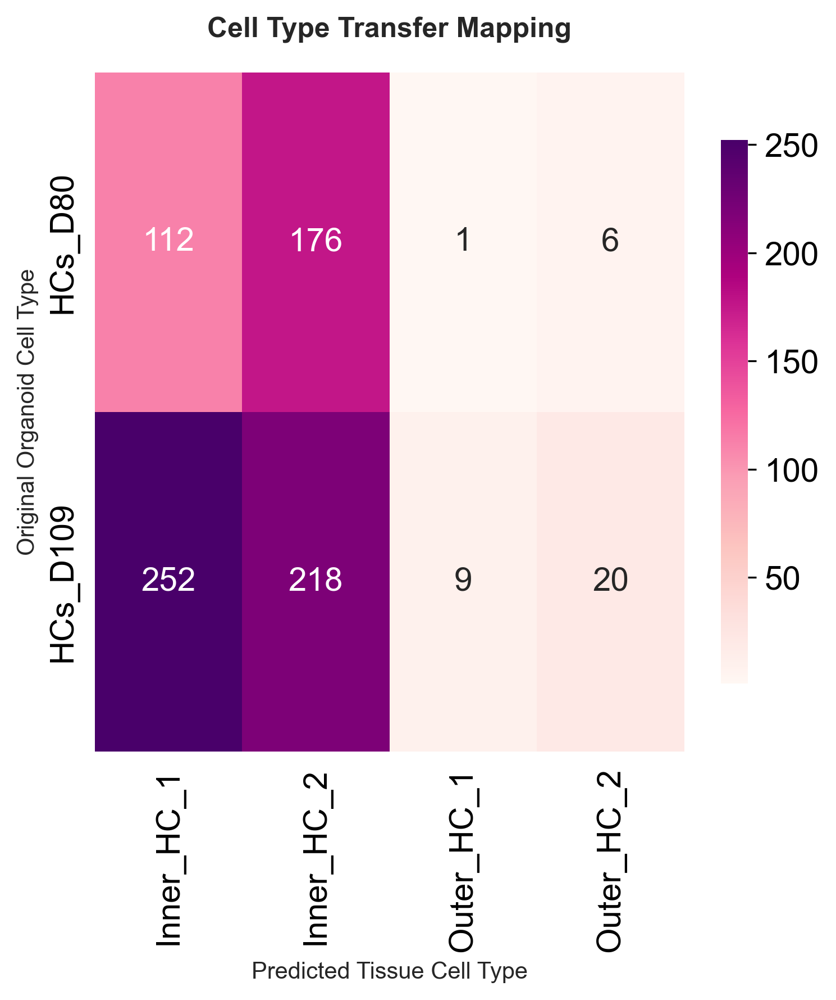

In [64]:

from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
import scipy.sparse as sp


X_train = tissue_coe_hc_strict_v2.layers['counts']
X_test = organoid_coe_hc_strict_v2.layers['counts']


if sp.issparse(X_train):
    X_train = X_train.toarray()
if sp.issparse(X_test):
    X_test = X_test.toarray()

print(f": {X_train.shape}")
print(f": {X_test.shape}")


pca = PCA(n_components=min(10, X_train.shape[1], X_test.shape[1]))
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

print(f" - : {X_train_pca.shape}, : {X_test_pca.shape}")


le = LabelEncoder()
y_train_encoded = le.fit_transform(tissue_coe_hc_strict_v2.obs['cell_type_final_v5_age'])

print(f": {y_train_encoded.shape}")
print(f": {le.classes_}")


rf = RandomForestClassifier(n_estimators=100000, random_state=42)
rf.fit(X_train_pca, y_train_encoded)


y_pred_encoded = rf.predict(X_test_pca)
y_pred = le.inverse_transform(y_pred_encoded)

print(f": {y_pred.shape}")

#
if len(y_pred) == len(organoid_coe_hc_strict_v2.obs):
    organoid_coe_hc_strict_v2.obs['predicted_celltype'] = y_pred
    
    print(organoid_coe_hc_strict_v2.obs['predicted_celltype'].value_counts())
else:
    print(f"❌ :  {len(y_pred)} vs  {len(organoid_coe_hc_strict_v2.obs)}")
    
    import anndata as ad
    result_adata = ad.AnnData(X=organoid_coe_hc_strict_v2.X, obs=organoid_coe_hc_strict_v2.obs.copy())
    result_adata.obs['predicted_celltype'] = y_pred[:len(result_adata)]  # 
    organoid_coe_hc_strict_v2 = result_adata
   


import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

# 
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA577', '#6A0572', '#AB83A1', '#3C91E6']
custom_cmap = LinearSegmentedColormap.from_list("custom", colors, N=256)

#1. 
fig = plt.figure(figsize=(20, 16))




# 4. 
ax4 = plt.subplot2grid((3, 4), (0, 3))
cross_tab = pd.crosstab(organoid_coe_hc_strict_v2.obs['cell_type_final_v5_age'], 
                       organoid_coe_hc_strict_v2.obs['predicted_celltype'])
sns.heatmap(cross_tab, annot=True, fmt='d', cmap='RdPu', ax=ax4, cbar_kws={'shrink': 0.8})
ax4.set_title('Cell Type Transfer Mapping', fontsize=12, fontweight='bold', pad=15)
ax4.set_xlabel('Predicted Tissue Cell Type', fontsize=10)
ax4.set_ylabel('Original Organoid Cell Type', fontsize=10)



plt.tight_layout()
plt.savefig(data_dir+'figures/figure6_and_S13/enhanced_label_transfer_analysis.pdf', dpi=300, bbox_inches='tight')
plt.show()

: (210, 27092)
: (794, 27092)
 - : (210, 65), : (794, 65)
: (210,)
: ['Inner_HC_1' 'Inner_HC_2' 'Inner_HC_3' 'Outer_HC_1' 'Outer_HC_2'
 'Outer_HC_3']


,C,1.0
,kernel,'linear'
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,True
,tol,1e-05
,cache_size,200
,class_weight,None
,verbose,False


: (794,)
predicted_celltype
Inner_HC_2    507
Inner_HC_1    242
Outer_HC_2     26
Inner_HC_3     18
Outer_HC_1      1
Name: count, dtype: int64

=== 创建增强的可视化 ===


<Axes: xlabel='predicted_celltype', ylabel='cell_type_final_v5_age'>

Text(0.5, 1.0, 'Cell Type Transfer Mapping')

Text(0.5, 1596.6127450980396, 'Predicted Tissue Cell Type')

Text(2320.38768115942, 0.5, 'Original Organoid Cell Type')

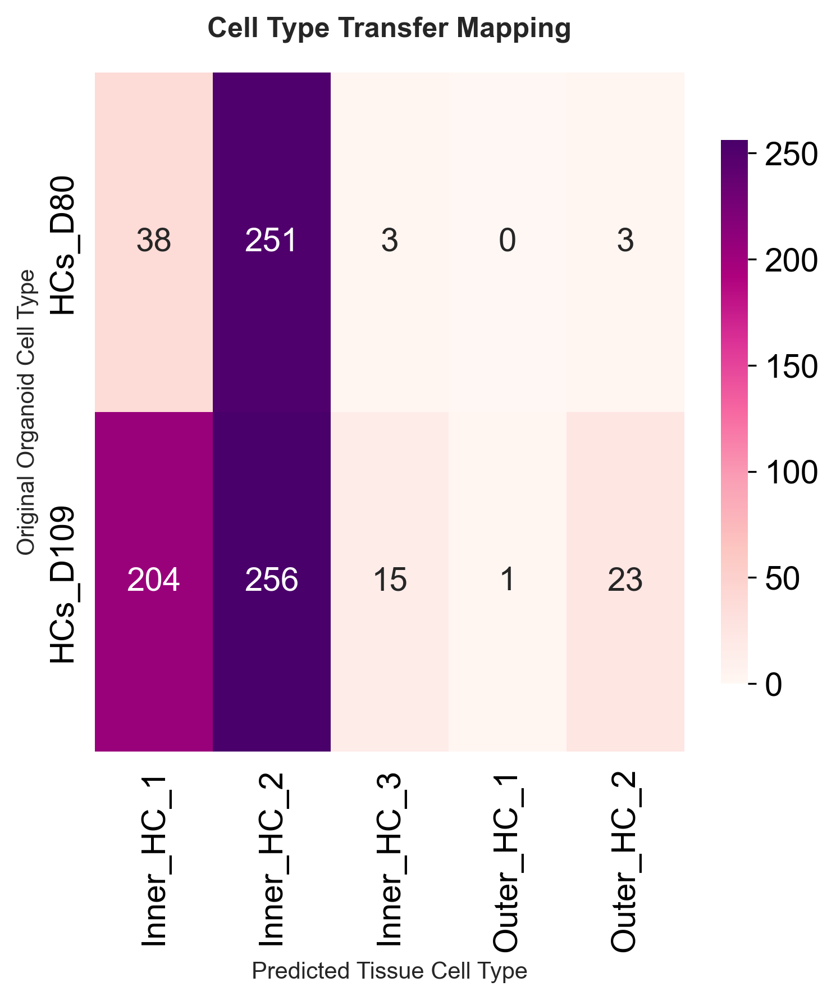

In [65]:

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
import scipy.sparse as sp
import numpy as np


X_train = tissue_coe_hc_strict_v2.layers['counts']
X_test = organoid_coe_hc_strict_v2.layers['counts']

# 
if sp.issparse(X_train):
    X_train = X_train.toarray()
if sp.issparse(X_test):
    X_test = X_test.toarray()

print(f": {X_train.shape}")
print(f": {X_test.shape}")

# 
pca = PCA(n_components=min(65, X_train.shape[1], X_test.shape[1]))
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

print(f" - : {X_train_pca.shape}, : {X_test_pca.shape}")

# 
le = LabelEncoder()
y_train_encoded = le.fit_transform(tissue_coe_hc_strict_v2.obs['cell_type_final_v5_age'])

print(f": {y_train_encoded.shape}")
print(f": {le.classes_}")

#  
svm = SVC(kernel='linear', probability=True, random_state=42,
          max_iter=100000, tol=1e-5, C=1.0,gamma='scale')  #

svm.fit(X_train_pca, y_train_encoded)

# 
y_pred_encoded = svm.predict(X_test_pca)
y_pred = le.inverse_transform(y_pred_encoded)

print(f": {y_pred.shape}")

# 
if len(y_pred) == len(organoid_coe_hc_strict_v2.obs):
    organoid_coe_hc_strict_v2.obs['predicted_celltype'] = y_pred
    
    print(organoid_coe_hc_strict_v2.obs['predicted_celltype'].value_counts())
else:
    print(f":  {len(y_pred)} vs  {len(organoid_coe_hc_strict_v2.obs)}")
    
    import anndata as ad
    result_adata = ad.AnnData(X=organoid_coe_hc_strict_v2.X, obs=organoid_coe_hc_strict_v2.obs.copy())
    result_adata.obs['predicted_celltype'] = y_pred[:len(result_adata)]  # 
    organoid_coe_hc_strict_v2 = result_adata
    

# 
print("\n=== 创建增强的可视化 ===")
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

# 
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA577', '#6A0572', '#AB83A1', '#3C91E6']
custom_cmap = LinearSegmentedColormap.from_list("custom", colors, N=256)

# 
fig = plt.figure(figsize=(20, 16))



# 
ax4 = plt.subplot2grid((3, 4), (0, 3))
cross_tab = pd.crosstab(organoid_coe_hc_strict_v2.obs['cell_type_final_v5_age'], 
                       organoid_coe_hc_strict_v2.obs['predicted_celltype'])
sns.heatmap(cross_tab, annot=True, fmt='d', cmap='RdPu', ax=ax4, cbar_kws={'shrink': 0.8})
ax4.set_title('Cell Type Transfer Mapping', fontsize=12, fontweight='bold', pad=15)
ax4.set_xlabel('Predicted Tissue Cell Type', fontsize=10)
ax4.set_ylabel('Original Organoid Cell Type', fontsize=10)



plt.tight_layout()
plt.savefig(data_dir+'figures/figure6_and_S13/enhanced_label_transfer_analysis_svm.pdf', dpi=300, bbox_inches='tight')
plt.show()



: (210, 27092)
: (794, 27092)
 - : (210, 15), : (794, 15)
: (210,)
: ['Inner_HC_1' 'Inner_HC_2' 'Inner_HC_3' 'Outer_HC_1' 'Outer_HC_2'
 'Outer_HC_3']


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.2s finished


,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,42
,solver,'lbfgs'
,max_iter,100000
,multi_class,'multinomial'


: (794,)
predicted_celltype
Inner_HC_2    574
Inner_HC_1    109
Outer_HC_2    107
Outer_HC_1      3
Outer_HC_3      1
Name: count, dtype: int64


<Axes: xlabel='predicted_celltype', ylabel='cell_type_final_v5_age'>

Text(0.5, 1.0, 'Cell Type Transfer Mapping')

Text(0.5, 1596.6127450980396, 'Predicted Tissue Cell Type')

Text(2320.38768115942, 0.5, 'Original Organoid Cell Type')

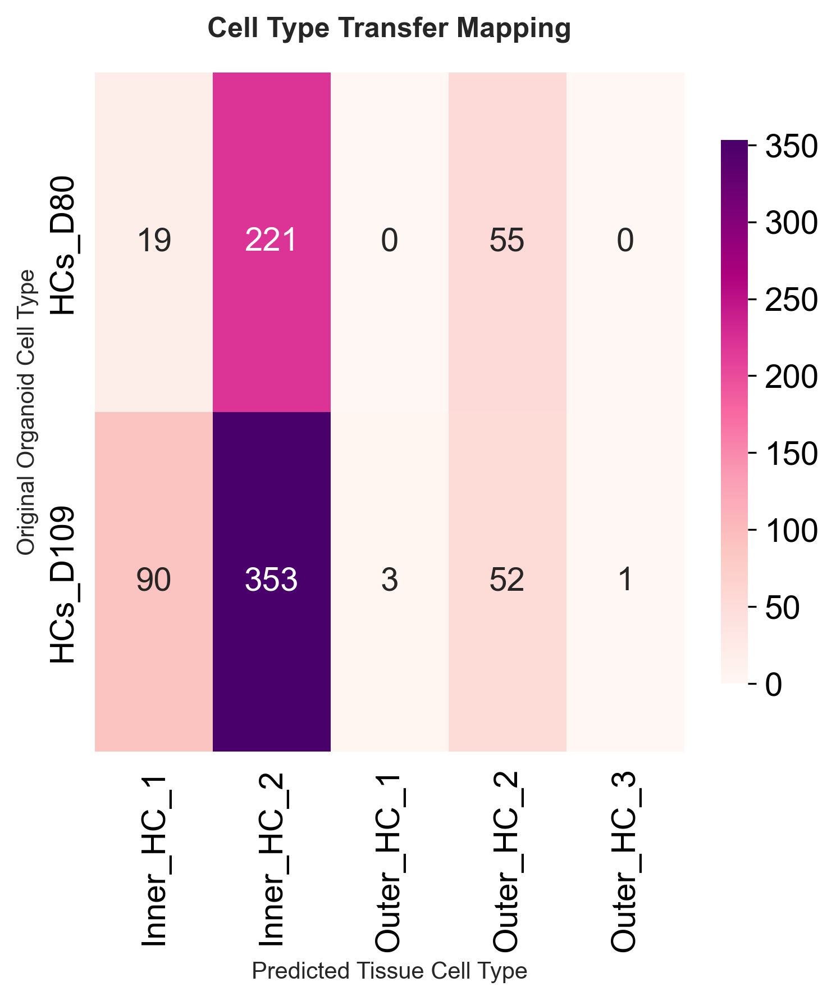

In [66]:

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
import scipy.sparse as sp
import numpy as np

# 
X_train = tissue_coe_hc_strict_v2.layers['counts']
X_test = organoid_coe_hc_strict_v2.layers['counts']

# 
if sp.issparse(X_train):
    X_train = X_train.toarray()
if sp.issparse(X_test):
    X_test = X_test.toarray()

print(f": {X_train.shape}")
print(f": {X_test.shape}")

# 
pca = PCA(n_components=min(15, X_train.shape[1], X_test.shape[1]))
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

print(f" - : {X_train_pca.shape}, : {X_test_pca.shape}")

# 
le = LabelEncoder()
y_train_encoded = le.fit_transform(tissue_coe_hc_strict_v2.obs['cell_type_final_v5_age'])

print(f": {y_train_encoded.shape}")
print(f": {le.classes_}")


lr = LogisticRegression(
    random_state=42,
    max_iter=100000,          
    C=1.0,                   
    penalty='l2',            # 'l1', 'l2', 'elasticnet', 'none'
    solver='lbfgs',          # 'lbfgs', 'liblinear', 'newton-cg', 'sag', 'saga'
    multi_class='multinomial', # 'multinomial', 'ovr'
    tol=1e-4,                # 
    verbose=1                # 
)

lr.fit(X_train_pca, y_train_encoded)

# 
y_pred_encoded = lr.predict(X_test_pca)
y_pred = le.inverse_transform(y_pred_encoded)

print(f": {y_pred.shape}")

# 
if len(y_pred) == len(organoid_coe_hc_strict_v2.obs):
    organoid_coe_hc_strict_v2.obs['predicted_celltype'] = y_pred
   
    print(organoid_coe_hc_strict_v2.obs['predicted_celltype'].value_counts())
else:
    print(f":  {len(y_pred)} vs  {len(organoid_coe_hc_strict_v2.obs)}")
    #
    import anndata as ad
    result_adata = ad.AnnData(X=organoid_coe_hc_strict_v2.X, obs=organoid_coe_hc_strict_v2.obs.copy())
    result_adata.obs['predicted_celltype'] = y_pred[:len(result_adata)]  # 
    organoid_coe_hc_strict_v2 = result_adata
   

# 

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

# 
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA577', '#6A0572', '#AB83A1', '#3C91E6']
custom_cmap = LinearSegmentedColormap.from_list("custom", colors, N=256)

# 
fig = plt.figure(figsize=(20, 16))



# 4. 
ax4 = plt.subplot2grid((3, 4), (0, 3))
cross_tab = pd.crosstab(organoid_coe_hc_strict_v2.obs['cell_type_final_v5_age'], 
                       organoid_coe_hc_strict_v2.obs['predicted_celltype'])
sns.heatmap(cross_tab, annot=True, fmt='d', cmap='RdPu', ax=ax4, cbar_kws={'shrink': 0.8})
ax4.set_title('Cell Type Transfer Mapping', fontsize=12, fontweight='bold', pad=15)
ax4.set_xlabel('Predicted Tissue Cell Type', fontsize=10)
ax4.set_ylabel('Original Organoid Cell Type', fontsize=10)



plt.tight_layout()
plt.savefig(data_dir+'figures/figure6_and_S13/enhanced_label_transfer_analysis_lr.pdf', dpi=300, bbox_inches='tight')
plt.show()



: (210, 27092)
: (794, 27092)
 - : (210, 10), : (794, 10)
: (210,)
: ['Inner_HC_1' 'Inner_HC_2' 'Inner_HC_3' 'Outer_HC_1' 'Outer_HC_2'
 'Outer_HC_3']


,n_neighbors,10
,weights,'distance'
,algorithm,'auto'
,leaf_size,10
,p,2
,metric,'minkowski'
,metric_params,None
,n_jobs,-1


: (794,)
predicted_celltype
Inner_HC_1    582
Inner_HC_2    129
Outer_HC_2     72
Inner_HC_3     10
Outer_HC_1      1
Name: count, dtype: int64


<Axes: xlabel='predicted_celltype', ylabel='cell_type_final_v5_age'>

Text(0.5, 1.0, 'Cell Type Transfer Mapping')

Text(0.5, 1596.6127450980396, 'Predicted Tissue Cell Type')

Text(2320.38768115942, 0.5, 'Original Organoid Cell Type')

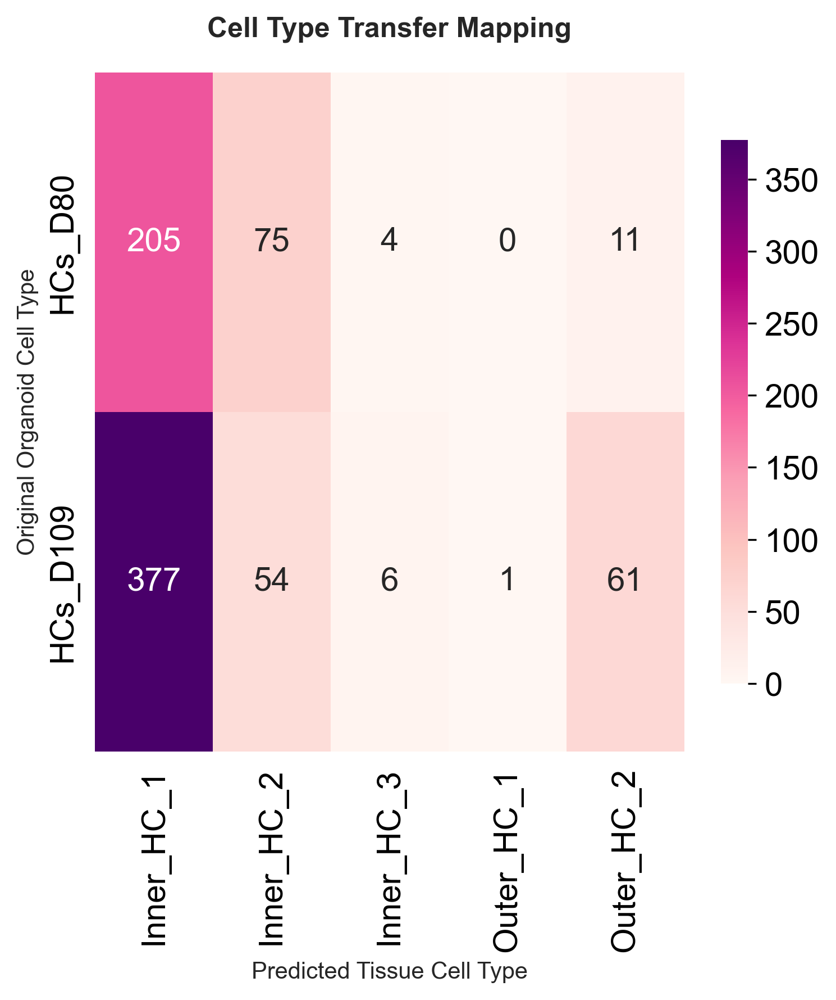

In [67]:
# 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
import scipy.sparse as sp
import numpy as np

# 
X_train = tissue_coe_hc_strict_v2.layers['counts']
X_test = organoid_coe_hc_strict_v2.layers['counts']

# 
if sp.issparse(X_train):
    X_train = X_train.toarray()
if sp.issparse(X_test):
    X_test = X_test.toarray()

print(f": {X_train.shape}")
print(f": {X_test.shape}")

# 
pca = PCA(n_components=min(10, X_train.shape[1], X_test.shape[1]))
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

print(f" - : {X_train_pca.shape}, : {X_test_pca.shape}")

# 
le = LabelEncoder()
y_train_encoded = le.fit_transform(tissue_coe_hc_strict_v2.obs['cell_type_final_v5_age'])

print(f": {y_train_encoded.shape}")
print(f": {le.classes_}")

# 
knn = KNeighborsClassifier(
    n_neighbors=10,           
    weights='distance',       # 'uniform'  'distance'
    algorithm='auto',         # 'auto', 'ball_tree', 'kd_tree', 'brute'
    leaf_size=10,             # 
    p=2,                      # 
    metric='minkowski',       # 
    n_jobs=-1                 # 
)

knn.fit(X_train_pca, y_train_encoded)

# 
y_pred_encoded = knn.predict(X_test_pca)
y_pred = le.inverse_transform(y_pred_encoded)

print(f": {y_pred.shape}")

# 
if len(y_pred) == len(organoid_coe_hc_strict_v2.obs):
    organoid_coe_hc_strict_v2.obs['predicted_celltype'] = y_pred
    
    print(organoid_coe_hc_strict_v2.obs['predicted_celltype'].value_counts())
else:
    print(f":  {len(y_pred)} vs  {len(organoid_coe_hc_strict_v2.obs)}")
    
    import anndata as ad
    result_adata = ad.AnnData(X=organoid_coe_hc_strict_v2.X, obs=organoid_coe_hc_strict_v2.obs.copy())
    result_adata.obs['predicted_celltype'] = y_pred[:len(result_adata)]  # 
    organoid_coe_hc_strict_v2 = result_adata
    p

# 

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

# 
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA577', '#6A0572', '#AB83A1', '#3C91E6']
custom_cmap = LinearSegmentedColormap.from_list("custom", colors, N=256)

# 
fig = plt.figure(figsize=(20, 16))



# 4. 
ax4 = plt.subplot2grid((3, 4), (0, 3))
cross_tab = pd.crosstab(organoid_coe_hc_strict_v2.obs['cell_type_final_v5_age'], 
                       organoid_coe_hc_strict_v2.obs['predicted_celltype'])
sns.heatmap(cross_tab, annot=True, fmt='d', cmap='RdPu', ax=ax4, cbar_kws={'shrink': 0.8})
ax4.set_title('Cell Type Transfer Mapping', fontsize=12, fontweight='bold', pad=15)
ax4.set_xlabel('Predicted Tissue Cell Type', fontsize=10)
ax4.set_ylabel('Original Organoid Cell Type', fontsize=10)



plt.tight_layout()
plt.savefig(data_dir+'figures/figure6_and_S13/enhanced_label_transfer_analysis_knn.pdf', dpi=300, bbox_inches='tight')
plt.show()



In [68]:
import os
import tempfile
import scanpy as sc
import scvi
import seaborn as sns
import torch

In [69]:
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Seed set to 0


Last run with scvi-tools version: 1.2.0


In [70]:
# Load dataset we want to transfer label to
adata_to = organoid_coe_hc_strict_v2 #organoid_coe_hc_strict_v2
print("adata_to dims: {}".format(adata_to.shape))

adata_to dims: (794, 27092)


In [71]:
adata_from=tissue_coe_hc_strict_v2
print("adata_from dims: {}".format(adata_from.shape))

adata_from dims: (210, 27092)


In [72]:
adata_to.obs['species']='organoid'
adata_from.obs['species']='tissue'

In [73]:
adata_to.obs['celltype']=adata_to.obs['cell_type_final_v5_age']
adata_from.obs['celltype']=adata_from.obs['cell_type_final_v5_age']

In [74]:
adata = anndata.concat([adata_to, adata_from])
adata

AnnData object with n_obs × n_vars = 1004 × 27092
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final_v4', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0', 'cell_type_final_v5', 'devtime', 'subclasses', 'leiden_scanvi_1.2', 'age_bins', 'cell_type_final_v5_age', 'species', 'celltype'
    obsm: 'X_pca', 'X_scANVI', 'X_umap'
    layers: 'counts', 'logcounts'

In [75]:
adata.X = adata.layers['counts'].copy()

### Reference mapping with scvi-tools

In [76]:
#Reference mapping with scvi-tools
adata_query=adata_to.copy()
adata_query
adata_ref=adata_from.copy()
adata_ref

AnnData object with n_obs × n_vars = 794 × 27092
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final_v4', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0', 'cell_type_final_v5', 'devtime', 'subclasses', 'leiden_scanvi_1.2', 'age_bins', 'cell_type_final_v5_age', 'predicted_celltype', 'species', 'celltype'
    obsm: 'X_pca', 'X_scANVI', 'X_umap'
    layers: 'counts', 'logcounts'

AnnData object with n_obs × n_vars = 210 × 27092
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final_v4', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0', 'cell_type_final_v5', 'devtime', 'subclasses', 'leiden_scanvi_1.2', 'age_bins', 'cell_type_final_v5_age', 'species', 'celltype'
    obsm: 'X_pca', 'X_scANVI', 'X_umap'
    layers: 'counts', 'logcounts'

In [77]:
adata = anndata.concat([adata_query, adata_ref])
adata

AnnData object with n_obs × n_vars = 1004 × 27092
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final_v4', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0', 'cell_type_final_v5', 'devtime', 'subclasses', 'leiden_scanvi_1.2', 'age_bins', 'cell_type_final_v5_age', 'species', 'celltype'
    obsm: 'X_pca', 'X_scANVI', 'X_umap'
    layers: 'counts', 'logcounts'

In [78]:
#We run highly variable gene selection on the reference data and use these same genes for the query data.
sc.pp.highly_variable_genes(adata_ref, n_top_genes=10000, batch_key="species", subset=True)
adata_ref

AnnData object with n_obs × n_vars = 210 × 10000
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final_v4', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0', 'cell_type_final_v5', 'devtime', 'subclasses', 'leiden_scanvi_1.2', 'age_bins', 'cell_type_final_v5_age', 'species', 'celltype'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg'
    obsm: 'X_pca', 'X_scANVI', 'X_umap'
  

In [79]:
# Find genes present in both datasets
common_genes = adata_query.var_names.intersection(adata_ref.var_names)

# Subset both datasets to only these common genes
adata_query = adata_query[:, common_genes].copy()
adata_ref = adata_ref[:, common_genes].copy()

In [80]:
#We train the reference using the standard SCVI workflow, except we add a few non-default parameters that were identified to work well with scArches. 
#It is essential to encode covariates here as this allows scArches to map new batches in the encoder to the existing data and 
#thereby provides batch integration.
scvi.model.SCVI.setup_anndata(adata_ref, batch_key="species", layer="counts")

In [81]:
scvi_ref = scvi.model.SCVI(
    adata_ref,
    use_layer_norm="both",
    use_batch_norm="none",
    encode_covariates=True,
    dropout_rate=0.2,
    n_layers=2,
)
scvi_ref.train()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=400` reached.


In [82]:
SCVI_LATENT_KEY = "X_scVI"
adata_ref.obsm[SCVI_LATENT_KEY] = scvi_ref.get_latent_representation()
sc.pp.neighbors(adata_ref, use_rep=SCVI_LATENT_KEY)
sc.tl.leiden(adata_ref)
sc.tl.umap(adata_ref)

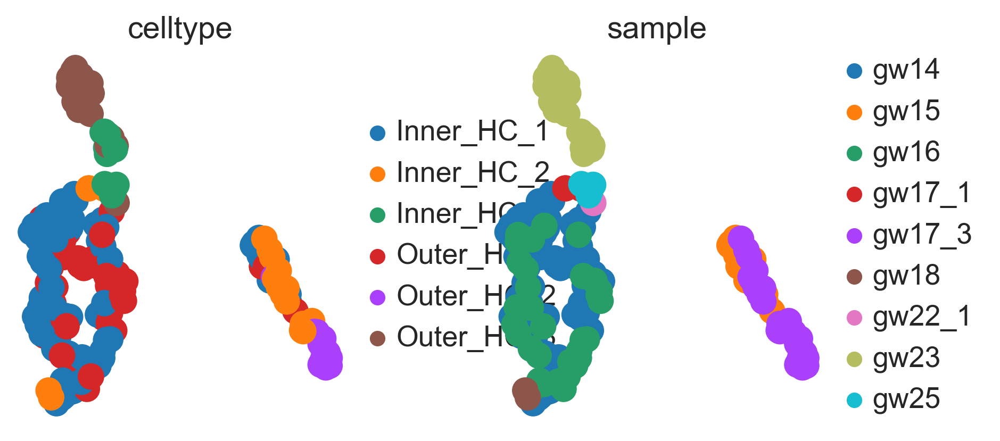

In [83]:
sc.pl.umap(
    adata_ref,
    color=["celltype", "sample"],
    frameon=False,
    ncols=2,
)

In [84]:
import os

# Define your custom save path
save_path = r"F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\figure6"

# Create directory if it doesn't exist
os.makedirs(save_path, exist_ok=True)

# Define full model path and save
scvi_ref_path = os.path.join(save_path, "human_hc_scvi_ref")
scvi_ref.save(scvi_ref_path, overwrite=True)

In [85]:
#First we validate that our query data is ready to be loaded into the reference model.
#Here we run prepare_query_anndata, which reorders the genes and pads any missing genes with 0s. 
#This should generally be run before reference mapping with scArches to ensure data correctness. 
#In the case of this tutorial, nothing happens as the query data is already “correct”.
# both are valid
scvi.model.SCVI.prepare_query_anndata(adata_query, scvi_ref_path)
scvi.model.SCVI.prepare_query_anndata(adata_query, scvi_ref)

INFO     File F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\figure6\human_hc_scvi_ref\model.pt  
         already downloaded                                                                                        
INFO     Found 100.0% reference vars in query data.                                                                
INFO     Found 100.0% reference vars in query data.                                                                


In [86]:
adata_query.obs['species'] = adata_query.obs['batch']

In [87]:
#Now we create the new query model instance
# both are valid
scvi_query = scvi.model.SCVI.load_query_data(
    adata_query,
    scvi_ref_path,
)
scvi_query = scvi.model.SCVI.load_query_data(
    adata_query,
    scvi_ref,
)

INFO     File F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\figure6\human_hc_scvi_ref\model.pt  
         already downloaded                                                                                        


In [88]:
# This is a typical SCVI object, and after training, can be used in any defined way.
#For training the query data, we recommend using a weight_decay of 0.0. 
#This ensures the latent representation of the reference cells will remain exactly the same if passing them through this new query model.
scvi_query.train(max_epochs=200, plan_kwargs={"weight_decay": 0.0})
adata_query.obsm[SCVI_LATENT_KEY] = scvi_query.get_latent_representation()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/200 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=200` reached.


In [89]:
sc.pp.neighbors(adata_query, use_rep=SCVI_LATENT_KEY)
sc.tl.leiden(adata_query)
sc.tl.umap(adata_query)

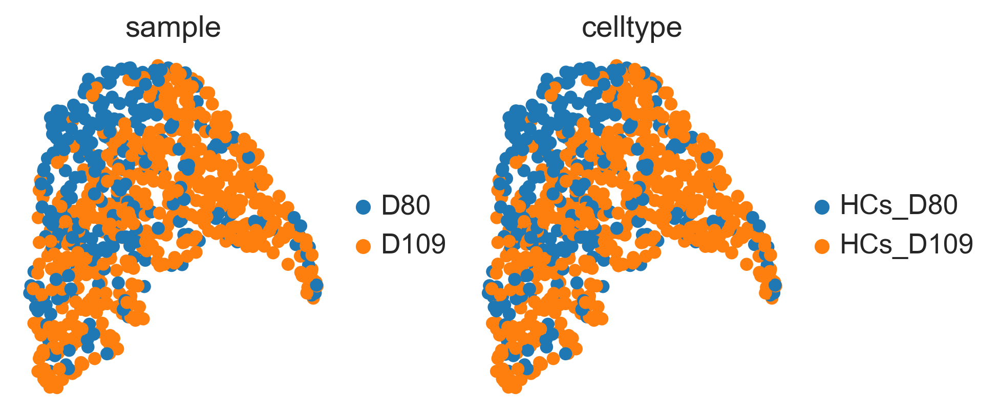

In [90]:
sc.pl.umap(
    adata_query,
    color=["sample", "celltype"],
    frameon=False,
    ncols=2,
)

In [91]:
adata_full = anndata.concat([adata_query, adata_ref])
adata_full

AnnData object with n_obs × n_vars = 1004 × 10000
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final_v4', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0', 'cell_type_final_v5', 'devtime', 'subclasses', 'leiden_scanvi_1.2', 'age_bins', 'cell_type_final_v5_age', 'species', 'celltype'
    obsm: 'X_pca', 'X_scANVI', 'X_umap', 'X_scVI'
    layers: 'counts', 'logcounts'

In [92]:
adata_full.obsm[SCVI_LATENT_KEY] = scvi_query.get_latent_representation(adata_full)

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


In [93]:
sc.pp.neighbors(adata_full, use_rep=SCVI_LATENT_KEY)
sc.tl.leiden(adata_full)
sc.tl.umap(adata_full)

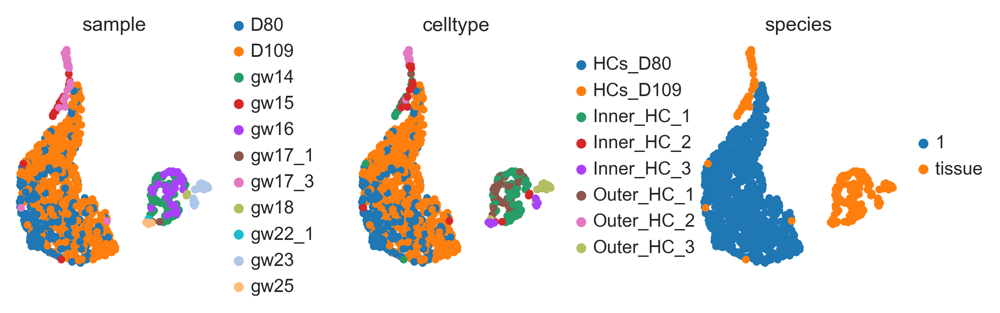

In [94]:
sc.pl.umap(
    adata_full,
    color=["sample", "celltype",'species'],
    frameon=False,wspace=0.5,
    ncols=3,
)

In [95]:
from scvi.model import SCVI, SCANVI

In [96]:
arches_params = {
    "n_layers": 2,               # Number of hidden layers
    "n_hidden": 128,             # Number of nodes per hidden layer
    "n_latent": 30,              # Dimensionality of latent space
    "dropout_rate": 0.1,         # Dropout rate
    "gene_likelihood": "nb",     # "nb" (negative binomial) or "zinb" (zero-inflated negative binomial)
    "use_layer_norm": "both",    # Normalization ("none", "encoder", "decoder", or "both")
    "use_batch_norm": "none"     # Batch normalization
}

In [97]:
scvi_model = SCVI(adata_ref, **arches_params)
scvi_model.train()
scanvi_model = SCANVI.from_scvi_model(scvi_model, unlabeled_category="Unknown",labels_key='celltype')
scanvi_model.train()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=400` reached.


INFO     Training for 10 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/10 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.


In [98]:
SCANVI_LABELS_KEY = "labels_scanvi"

adata_ref.obs[SCANVI_LABELS_KEY] = adata_ref.obs["celltype"].values

In [99]:
# unlabeled category does not exist in adata.obs[labels_key]
# so all cells are treated as labeled
scanvi_ref = scvi.model.SCANVI.from_scvi_model(
    scvi_ref,
    unlabeled_category="Unknown",
    labels_key=SCANVI_LABELS_KEY,
)

In [100]:
scanvi_ref.train(max_epochs=20, n_samples_per_label=100)

INFO     Training for 20 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/20 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=20` reached.


In [101]:
SCANVI_LATENT_KEY = "X_scANVI"

adata_ref.obsm[SCANVI_LATENT_KEY] = scanvi_ref.get_latent_representation()
sc.pp.neighbors(adata_ref, use_rep=SCANVI_LATENT_KEY)
sc.tl.leiden(adata_ref)
sc.tl.umap(adata_ref)

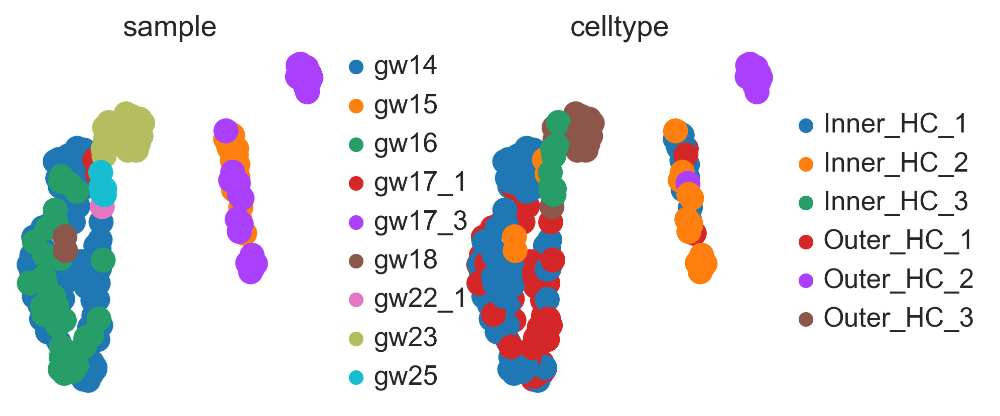

In [102]:
sc.pl.umap(
    adata_ref,
    color=["sample", "celltype"],
    frameon=False,
    ncols=2,
)

In [103]:
scanvi_ref_path = os.path.join(save_path, "human_hc_scanvi_ref")
scanvi_ref.save(scanvi_ref_path, overwrite=True)

In [104]:
# again a no-op in this tutorial, but good practice to use
scvi.model.SCANVI.prepare_query_anndata(adata_query, scanvi_ref_path)

INFO     File F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\figure6\human_hc_scanvi_ref\model.pt
         already downloaded                                                                                        
INFO     Found 100.0% reference vars in query data.                                                                


In [105]:
scanvi_query = scvi.model.SCANVI.load_query_data(adata_query, scanvi_ref_path)

INFO     File F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\figure6\human_hc_scanvi_ref\model.pt
         already downloaded                                                                                        


In [106]:
scanvi_query.train(
    max_epochs=100,
    plan_kwargs={"weight_decay": 0.0},
    check_val_every_n_epoch=10,
)

INFO     Training for 100 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.


In [107]:
SCANVI_PREDICTIONS_KEY = "predictions_scanvi"

adata_query.obsm[SCANVI_LATENT_KEY] = scanvi_query.get_latent_representation()
adata_query.obs[SCANVI_PREDICTIONS_KEY] = scanvi_query.predict()

<Figure size 450x450 with 0 Axes>

Text(0.5, 0, 'Predicted')

Text(0, 0.5, 'Observed')

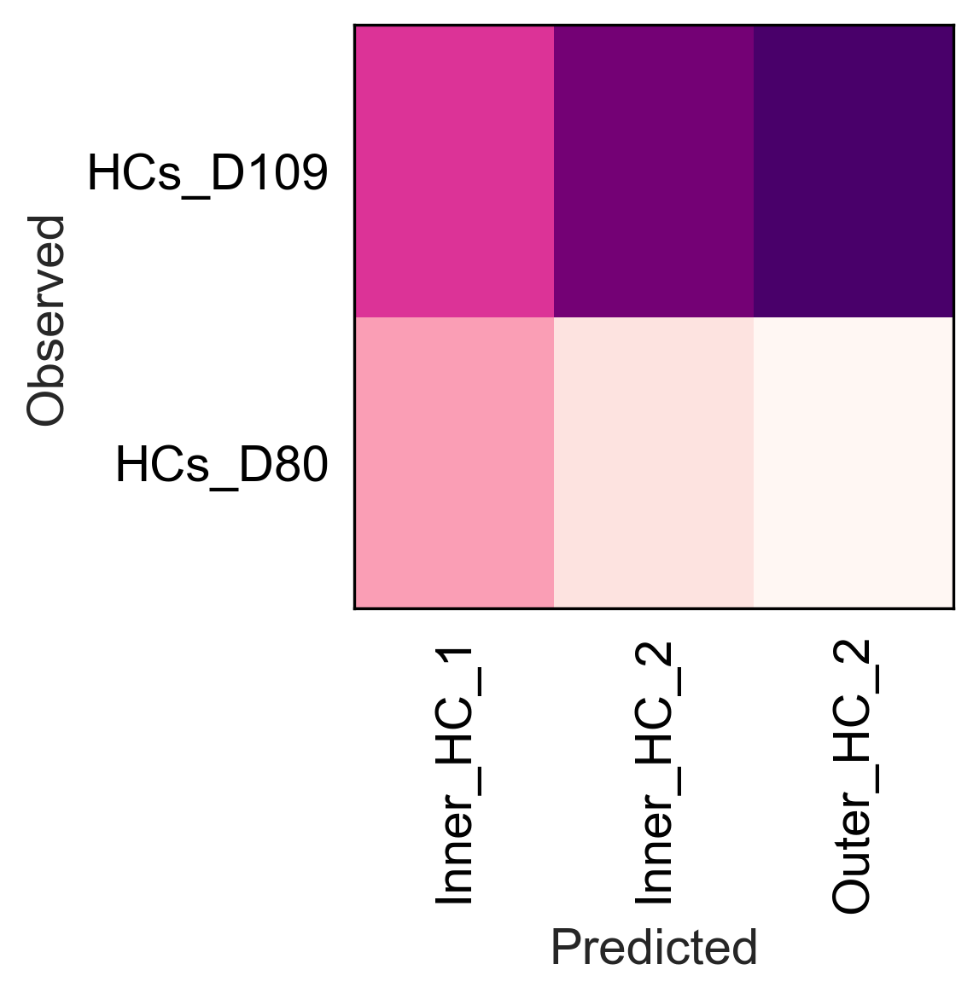

In [108]:
df = adata_query.obs.groupby(["celltype", SCANVI_PREDICTIONS_KEY]).size().unstack(fill_value=0)
norm_df = df / df.sum(axis=0)

plt.figure(figsize=(3, 3))
_ = plt.pcolor(norm_df,cmap='RdPu')
_ = plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xlabel("Predicted")
plt.ylabel("Observed")

<Figure size 375x300 with 0 Axes>

Text(0.5, 0, 'Predicted')

Text(0, 0.5, 'Observed')

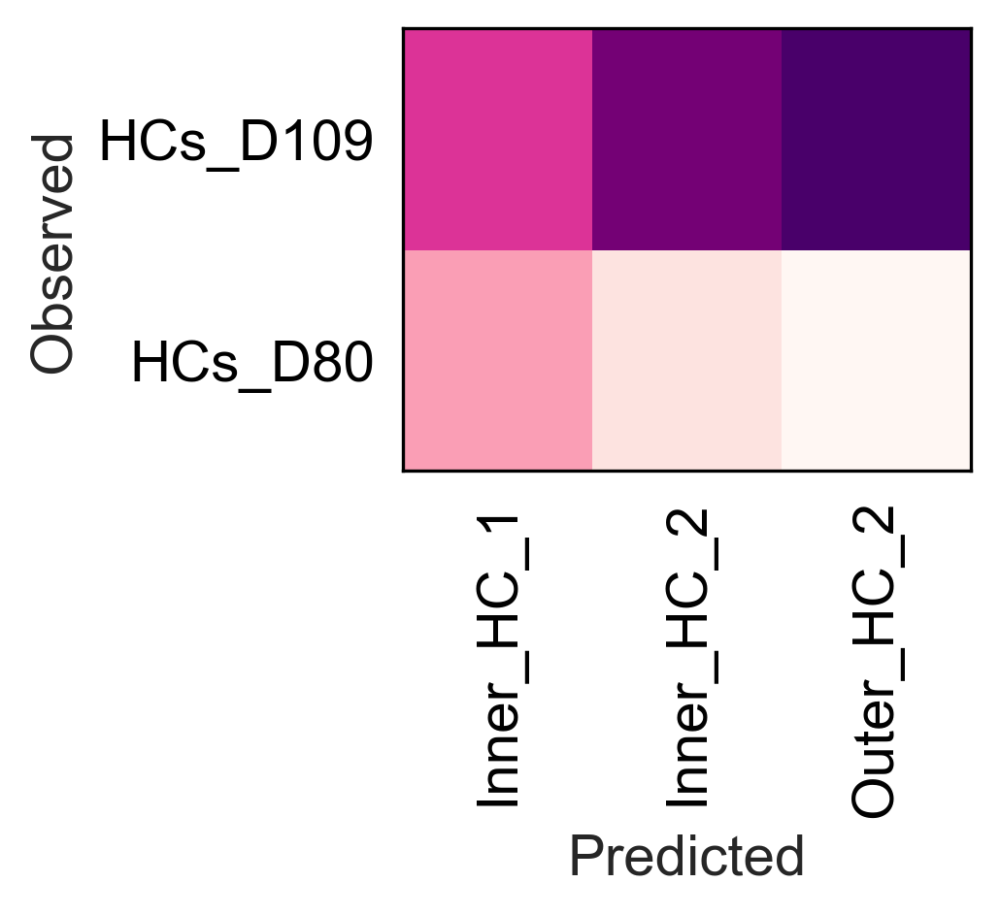

In [109]:
plt.figure(figsize=(2.5, 2))
_ = plt.pcolor(norm_df,cmap='RdPu')
_ = plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xlabel("Predicted")
plt.ylabel("Observed")
plt.savefig(data_dir+'figures/figure6_and_S13/CORRPLOT_HUMAN-ORGANOID_HC_scvi_ref_mapping_10000HVGS.pdf')

### FIGURES13 a/b

In [110]:
adata = sc.read(data_dir + 'human_cochlea_annotation.h5ad')

In [111]:
adata_sub=sc.read('human_coe_sub_for_trajectory_analysis_v4.h5ad')

In [112]:
cluster_annotation = {
 'FGF20+SULF1+Medial_PSD': 'FGFR3+PROX1+Lateral_PSD',
     'TBX2+MEIS2+Early_PSD': 'TBX2+MEIS2+Early_PSD',
     'FGFR3+PROX1+Lateral_PSD': 'FGF20+SULF1+Medial_PSD',
    
     'Outer_HC': 'Outer_HC',
     'Inner_HC': 'Inner_HC',
    
     'LGR6+TMPRSS3+_PC': 'LGR6+TMPRSS3+_PC',
    
    'LGR6+TMPRSS3+_PC': 'LGR6+TMPRSS3+_PC',
   
    'PPP1R2+HIST1H2AC+_PC': 'PPP1R2+HIST1H2AC+_PC',
    
     'ISL1+ST3GAL1+IBC_IPhC': 'ISL1+ST3GAL1+IBC_IPhC',
    'FOXG1+RELN+IBC_IPhC': 'FOXG1+RELN+IBC_IPhC',
     'SPOCK1+PEX5L+IBC_IPhC': 'SPOCK1+PEX5L+IBC_IPhC',
    'SLC24A3+ZBTB20+IBC_IPhC': 'SLC24A3+ZBTB20+IBC_IPhC',
    
     'SERPINE2+JAG1+DC': 'SERPINE2+JAG1+DC',
    'PTGDS+CEMIP+DC': 'PTGDS+CEMIP+DC',
    
     'EGFR+ELMO1+HEC': 'EGFR+ELMO1+HEC',
    'FST+AFF3+HEC': 'FST+AFF3+HEC',

}
adata_sub.obs['cell_type_final_v4'] = adata_sub.obs['cell_type_final_v4'].map(cluster_annotation).astype('category')

In [113]:
meta['sample'] = meta['sample_id'].astype('str')
plotmeta = list(meta.columns)
plotmeta.append('sample')
print('Number of sample: ', meta.index.size)
meta

Number of sample:  15


         sample_id           donor  gw  gender 10xKit sequencing   dataset  \
sample                                                                       
9.5gw          gw9  not_provided_1   9  female    SC3  snRNA-seq    public   
11.2gw        gw11  not_provided_2  11    male    SC3  snRNA-seq    public   
14+3gw        gw14       F20240701  14    male    SC3  snRNA-seq  in-house   
15gw          gw15  not_provided_3  15  female    SC3  scRNA-seq    public   
16+4gw        gw16       F20241018  16    male    SC3  snRNA-seq  in-house   
17+2gw      gw17_1       F20220807  17    male    SC3  snRNA-seq  in-house   
17+3gw      gw17_2       F20240928  17  female    SC3  snRNA-seq  in-house   
17gw        gw17_3  not_provided_4  17    male    SC3  scRNA-seq    public   
18+3gw        gw18       F20220806  18    male    SC3  snRNA-seq  in-house   
20gw          gw20     F20240928-2  20  female    SC3  snRNA-seq  in-house   
22+2gw_1    gw22_1       F20241021  22    male    SC3  snRNA-seq

In [114]:
holder = []
for sample in meta.index:
    print(sample)
    # Load 10x data as AnnData
    #adata_sample = sc.read_10x_mtx(data_dir+'rawdata_pbx3_neo/'+sample+'/outs/filtered_feature_bc_matrix/',cache=True)
    holder.append(sc.read(data_dir+sample+'/human_gw_raw.h5ad',cache=True)) 
    # Set names of observation as sample + _ + barcode/probe
    holder[-1].obs_names = [sample+'_'+i.split('-')[0] for i in holder[-1].obs_names]
    # Filer genes expressed in less than 3 cells
    sc.pp.filter_genes(holder[-1], min_cells=3)
    # Filer cells with less than 10 genes expressed
    sc.pp.filter_cells(holder[-1], min_genes=10)
    # add in metadata
    holder[-1].obs['sample'] = sample
    for val in meta.columns:
        holder[-1].obs[val] = meta[val][sample]
    # Extract mitochondial genes
    mito_genes = [name for name in holder[-1].var_names if name.startswith('MT-')]
    #for each cell compute fraction of counts in mito genes vs. all genes
    #the `.A1` is only necessary, as X is sparse - it transform to a dense array after summing
    holder[-1].obs['percent_mito'] = np.sum(
        holder[-1][:, mito_genes].X, axis=1).A1 / np.sum(holder[-1].X, axis=1).A1
    #add the total counts per cell as observations-annotation to adata
    holder[-1].obs['n_counts'] = holder[-1].X.sum(axis=1).A1
    print('Total number of cells: {:d}'.format(holder[-1].n_obs))
    print('Total number of genes: {:d}'.format(holder[-1].n_vars))

9.5gw
Total number of cells: 4284
Total number of genes: 22512
11.2gw
Total number of cells: 4051
Total number of genes: 26703
14+3gw
Total number of cells: 12081
Total number of genes: 29961
15gw
Total number of cells: 2146
Total number of genes: 18995
16+4gw
Total number of cells: 8708
Total number of genes: 29950
17+2gw
Total number of cells: 6773
Total number of genes: 26118
17+3gw
Total number of cells: 7148
Total number of genes: 26633
17gw
Total number of cells: 4538
Total number of genes: 19729
18+3gw
Total number of cells: 9595
Total number of genes: 26884
20gw
Total number of cells: 3833
Total number of genes: 26808
22+2gw_1
Total number of cells: 5837
Total number of genes: 28742
22+2gw_2
Total number of cells: 7861
Total number of genes: 26226
23+2gw
Total number of cells: 3597
Total number of genes: 24258
25+6gw
Total number of cells: 13936
Total number of genes: 28576
26+3gw
Total number of cells: 7872
Total number of genes: 25874


In [115]:
# confirm N samples
print(len(holder))
# merge datasets
adata_all = holder[0].concatenate(holder[1:],join='outer',index_unique=None)
# copy of this matrix in Compressed Sparse Row format
adata_all.X = adata_all.X.tocsr()
adata_all

15


AnnData object with n_obs × n_vars = 102260 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'species', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'Gene-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispersions-10', 'dispersions_norm-10', 'n_cells

In [116]:
adata_new=adata_all[adata_sub.obs.index]

In [117]:
#adata_new.layers['counts']=adata_integration.layers['counts']
adata=adata_sub.copy()
adata_new.obsp['connectivities']=adata.obsp['connectivities']
adata_new.obsp['distances']=adata.obsp['distances']

adata_new.obsm['X_pca']=adata.obsm['X_pca']
adata_new.obsm['X_scANVI']=adata.obsm['X_scANVI']
adata_new.obsm['X_scVI']=adata.obsm['X_scVI']
adata_new.obsm['X_umap']=adata.obsm['X_umap']
adata_new.obsm['_scvi_extra_categorical_covs']=adata.obsm['_scvi_extra_categorical_covs']
adata_new.obsm['_scvi_extra_continuous_covs']=adata.obsm['_scvi_extra_continuous_covs']

adata_new.uns['_scvi_manager_uuid']=adata.uns['_scvi_manager_uuid']
adata_new.uns['_scvi_uuid']=adata.uns['_scvi_uuid']
adata_new.uns['annotation_colors']=adata.uns['annotation_colors']
adata_new.uns['ccgs']=adata.uns['ccgs']
adata_new.uns['cell_type_final_colors']=adata.uns['cell_type_final_colors']
adata_new.uns['cell_type_final_v4_colors']=adata.uns['cell_type_final_v4_colors']
adata_new.uns['gender_colors']=adata.uns['gender_colors']
adata_new.uns['hvg']=adata.uns['hvg']
adata_new.uns['leiden']=adata.uns['leiden']
adata_new.uns['leiden_R']=adata.uns['leiden_R']
adata_new.uns['leiden_R_colors']=adata.uns['leiden_R_colors']
adata_new.uns['leiden_res2.0_colors']=adata.uns['leiden_res2.0_colors']
adata_new.uns['leiden_res2.0']=adata.uns['leiden_res2.0']
adata_new.uns['leiden_scanvi_2.0_colors']=adata.uns['leiden_scanvi_2.0_colors']
adata_new.uns['log1p']=adata.uns['log1p']
adata_new.uns['neighbors']=adata.uns['neighbors']
adata_new.uns['sample_colors']=adata.uns['sample_colors']
adata_new.uns['umap']=adata.uns['umap']
adata_new.uns['leiden_scanvi_2.0']=adata.uns['leiden_scanvi_2.0']

adata_new.var['highly_variable']=adata.var['highly_variable']
adata_new.var['highly_variable_rank']=adata.var['highly_variable_rank']
adata_new.var['means']=adata.var['means']
adata_new.var['variances']=adata.var['variances']
adata_new.var['variances_norm']=adata.var['variances_norm']

adata_new.obs['cell_type_final_v4']=adata.obs['cell_type_final_v4']
adata_new.obs['cell_type_final']=adata.obs['cell_type_final']
adata_new.obs['low_ncounts']=adata.obs['low_ncounts']
adata_new.obs['low_ncounts_high_mito']=adata.obs['low_ncounts_high_mito']
adata_new.obs['S_score']=adata.obs['S_score']
adata_new.obs['G2M_score']=adata.obs['G2M_score']
adata_new.obs['phase']=adata.obs['phase']
adata_new.obs['scrublet_score']=adata.obs['scrublet_score']
adata_new.obs['scrublet_cluster_score']=adata.obs['scrublet_cluster_score']
adata_new.obs['zscore']=adata.obs['zscore']
adata_new.obs['bh_pval']=adata.obs['bh_pval']
adata_new.obs['bonf_pval']=adata.obs['bonf_pval']
adata_new.obs['is_doublet']=adata.obs['is_doublet']
adata_new.obs['is_doublet_scrub']=adata.obs['is_doublet_scrub']
adata_new.obs['_scvi_batch']=adata.obs['_scvi_batch']
adata_new.obs['_scvi_labels']=adata.obs['_scvi_labels']
adata_new.obs['leiden_scanvi_2.0']=adata.obs['leiden_scanvi_2.0']
adata_new.obs['leiden_res2.0']=adata.obs['leiden_res2.0']

In [118]:
cluster_annotation = {
 
    'FGF20+SULF1+Medial_PSD': 'Medial_PSD',
     'TBX2+MEIS2+Early_PSD': 'Early_PSD',
     'FGFR3+PROX1+Lateral_PSD': 'Lateral_PSD',
    
     'Outer_HC': 'Outer_HC',
     'Inner_HC': 'Inner_HC',
    
     'LGR6+TMPRSS3+_PC': 'PC',
    
    'LGR6+TMPRSS3+_PC': 'PC',
   
    'PPP1R2+HIST1H2AC+_PC': 'PC',
    
     'ISL1+ST3GAL1+IBC_IPhC': 'IBC_IPhC',
    'FOXG1+RELN+IBC_IPhC': 'IBC_IPhC',
     'SPOCK1+PEX5L+IBC_IPhC': 'IBC_IPhC',
    'SLC24A3+ZBTB20+IBC_IPhC': 'IBC_IPhC',
    
     'SERPINE2+JAG1+DC': 'DC',
    'PTGDS+CEMIP+DC': 'DC',
    
     'EGFR+ELMO1+HEC': 'HEC',
    'FST+AFF3+HEC': 'HEC',

}
adata_new.obs['cell_type_final_v5'] = adata_new.obs['cell_type_final_v4'].map(cluster_annotation).astype('category')

In [119]:
SC_gene = [
     "TSC22D1",'EPYC','FBXO2','TMOD1','FGFR3','GATA3','GJB2','DPYSL2','LGR6','PROX1','SMPX','S100A1',
    'AQP4','CEACAM16','SLC1A3','S100A6','FGF10','ANXA1','KCNQ5','MEIS1','CHST9','MEIS2','FST',
   'OTOG','OTOGL','LGR5',

 
 'OTOA',
     'EPYC',
     ]
   
sc.tl.score_genes(adata_new,SC_gene)

<Axes: ylabel='score'>

[Text(0, 0, 'Inner_HC'),
 Text(1, 0, 'Outer_HC'),
 Text(2, 0, 'Early_PSD'),
 Text(3, 0, 'Lateral_PSD'),
 Text(4, 0, 'Medial_PSD'),
 Text(5, 0, 'DC'),
 Text(6, 0, 'HEC'),
 Text(7, 0, 'IBC_IPhC'),
 Text(8, 0, 'PC')]

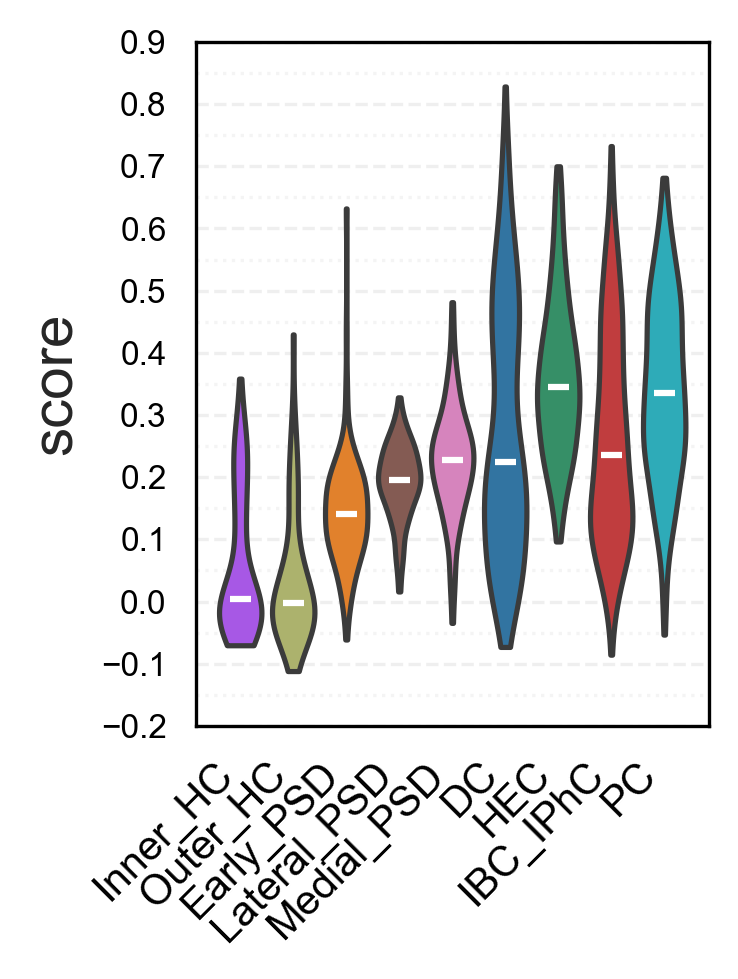

In [120]:
sc.set_figure_params(figsize=(3,3), frameon=False, dpi=150, dpi_save=600)

# 
sc.pl.violin(
    adata_new, 
    ['score'], 
    groupby='cell_type_final_v5',
    order=['Inner_HC', 'Outer_HC', 'Early_PSD','Lateral_PSD','Medial_PSD','DC','HEC','IBC_IPhC','PC'],
    jitter=False, 
    rotation=45,
    show=False,  # 
    stripplot=False  # 
)

# 
ax = plt.gca()

# 
for i, category in enumerate(['Inner_HC', 'Outer_HC', 'Early_PSD','Lateral_PSD','Medial_PSD','DC','HEC','IBC_IPhC','PC']):
    # 
    median_val = adata_new.obs[adata_new.obs['cell_type_final_v5'] == category]['score'].median()
    
    # 
    ax.hlines(
        median_val, 
        i - 0.2, 
        i + 0.2, 
        color='white', 
        linewidth=1.5,
        linestyle='-'
    )

# 
x_labels = ['Inner_HC', 'Outer_HC', 'Early_PSD','Lateral_PSD','Medial_PSD','DC','HEC','IBC_IPhC','PC']
ax.set_xticklabels(x_labels, fontsize=10, rotation=45, ha='right')


import numpy as np

y_min, y_max = ax.get_ylim()

major_ticks = np.arange(round(y_min, 1), round(y_max, 1) + 0.1, 0.1)
ax.set_yticks(major_ticks)


minor_ticks = np.arange(round(y_min, 1), round(y_max, 1) + 0.05, 0.05)
ax.set_yticks(minor_ticks, minor=True)


ax.grid(axis='y', which='major', linestyle='--', alpha=0.3)
ax.grid(axis='y', which='minor', linestyle=':', alpha=0.2)

ax.tick_params(axis='y', labelsize=8) 


plt.subplots_adjust(bottom=0.15)


plt.tight_layout()
plt.savefig(data_dir+'figures/figure6_and_S13/human_cochlea_epithelium_score.pdf', 
            bbox_inches='tight', 
            dpi=600)
plt.show()

In [121]:
adata_d20 = sc.read_10x_mtx('./D20')
print(adata_d20)
adata_d80 = sc.read_10x_mtx('./D80')
print(adata_d80)
adata_d109 = sc.read_10x_mtx('./D109')
print(adata_d109)

AnnData object with n_obs × n_vars = 11784 × 33538
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 10403 × 33538
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 11107 × 36601
    var: 'gene_ids', 'feature_types'


In [122]:
adata_d20.obs_names_make_unique()
adata_d20.var_names_make_unique()
adata_d80.obs_names_make_unique()
adata_d80.var_names_make_unique()
adata_d109.obs_names_make_unique()
adata_d109.var_names_make_unique()

In [123]:
adata_d20=sc.AnnData(adata_d20.X,obs=adata_d20.obs,var=adata_d20.var)
adata_d20.var["Gene"]=adata_d20.var_names
adata_d20.obs["CellID"]=adata_d20.obs_names
adata_d80=sc.AnnData(adata_d80.X,obs=adata_d80.obs,var=adata_d80.var)
adata_d80.var["Gene"]=adata_d80.var_names
adata_d80.obs["CellID"]=adata_d80.obs_names
adata_d109=sc.AnnData(adata_d109.X,obs=adata_d109.obs,var=adata_d109.var)
adata_d109.var["Gene"]=adata_d109.var_names
adata_d109.obs["CellID"]=adata_d109.obs_names

In [124]:
adata_d20.var['mt'] = adata_d20.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_d20, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
adata_d80.var['mt'] = adata_d80.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_d80, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
adata_d109.var['mt'] = adata_d109.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_d109, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [125]:
# Saving count data
adata_d20.layers["counts"] = adata_d20.X.copy()
adata_d80.layers["counts"] = adata_d80.X.copy()
adata_d109.layers["counts"] = adata_d109.X.copy()

In [126]:
# Normalizing to median total counts
sc.pp.normalize_total(adata_d20)
# Logarithmize the data
sc.pp.log1p(adata_d20)
# Normalizing to median total counts
sc.pp.normalize_total(adata_d80)
# Logarithmize the data
sc.pp.log1p(adata_d80)
# Normalizing to median total counts
sc.pp.normalize_total(adata_d109)
# Logarithmize the data
sc.pp.log1p(adata_d109)

In [127]:
adata_d20.layers["logcounts"] = adata_d20.X.copy()
adata_d80.layers["logcounts"] = adata_d80.X.copy()
adata_d109.layers["logcounts"] = adata_d109.X.copy()

In [129]:
meta['sample'] = meta['sample_id'].astype('str')
plotmeta = list(meta.columns)
plotmeta.append('sample')
print('Number of sample: ', meta.index.size)
meta

Number of sample:  3


       sample_id sample
sample                 
D20          D20    D20
D80          D80    D80
D109        D109   D109

In [130]:
holder = []
for sample in meta.index:
    print(sample)
    # Load 10x data as AnnData
    #adata_sample = sc.read_10x_mtx(data_dir+'rawdata_pbx3_neo/'+sample+'/outs/filtered_feature_bc_matrix/',cache=True)
    holder.append(sc.read(data_dir+sample+'/human_orgn_raw.h5ad',cache=True)) 
    # Set names of observation as sample + _ + barcode/probe
    holder[-1].obs_names = [sample+'_'+i.split('-')[0] for i in holder[-1].obs_names]
    # Filer genes expressed in less than 3 cells
    sc.pp.filter_genes(holder[-1], min_cells=3)
    # Filer cells with less than 10 genes expressed
    sc.pp.filter_cells(holder[-1], min_genes=10)
    # add in metadata
    holder[-1].obs['sample'] = sample
    for val in meta.columns:
        holder[-1].obs[val] = meta[val][sample]
    # Extract mitochondial genes
    mito_genes = [name for name in holder[-1].var_names if name.startswith('MT-')]
    #for each cell compute fraction of counts in mito genes vs. all genes
    #the `.A1` is only necessary, as X is sparse - it transform to a dense array after summing
    holder[-1].obs['percent_mito'] = np.sum(
        holder[-1][:, mito_genes].X, axis=1).A1 / np.sum(holder[-1].X, axis=1).A1
    #add the total counts per cell as observations-annotation to adata
    holder[-1].obs['n_counts'] = holder[-1].X.sum(axis=1).A1
    print('Total number of cells: {:d}'.format(holder[-1].n_obs))
    print('Total number of genes: {:d}'.format(holder[-1].n_vars))

D20
Total number of cells: 11784
Total number of genes: 22471
D80
Total number of cells: 10403
Total number of genes: 24291
D109
Total number of cells: 11107
Total number of genes: 27520


In [131]:
# confirm N samples
print(len(holder))
# merge datasets
adata_all_orgn = holder[0].concatenate(holder[1:],join='outer',index_unique=None)
# copy of this matrix in Compressed Sparse Row format
adata_all_orgn.X = adata_all_orgn.X.tocsr()
adata_all_orgn

3


AnnData object with n_obs × n_vars = 33294 × 29437
    obs: 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'sample', 'sample_id', 'percent_mito', 'n_counts', 'batch'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'Gene-2', 'mt-2', 'n_cells_by_counts-2', 'mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 'n_cells-2'
    layers: 'counts', 'logcounts'

In [132]:
hu_orgn=sc.read('Hu_organoids_python_v2.h5ad')

In [133]:

hu_orgn.obs.index = [barcode.replace("-1", "") for barcode in hu_orgn.obs.index]

adata_new_orgn = adata_all_orgn[hu_orgn.obs.index]

In [134]:
adata_new_orgn.obsm['X_umap']=hu_orgn.obsm['X_umap_harmony']
adata_new_orgn.obsm['X_pca']=hu_orgn.obsm['X_pca']

adata_new_orgn.var['vst.mean']=hu_orgn.var['vst.mean']
adata_new_orgn.var['vst.variance']=hu_orgn.var['vst.variance']

adata_new_orgn.obs['devtime']=hu_orgn.obs['devtime']
adata_new_orgn.obs['subclasses']=hu_orgn.obs['subclasses']

In [143]:
#subset cochlear epithelium domains for downsream analysis
hu_orgn_coe= adata_new_orgn[adata_new_orgn.obs['subclasses'].isin(['HCs','LGR5_neg_transitional','LGR5_pos_transitional'])]
hu_orgn_coe
hu_orgn_coe.obs['subclasses'].value_counts()

View of AnnData object with n_obs × n_vars = 9270 × 29437
    obs: 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'sample', 'sample_id', 'percent_mito', 'n_counts', 'batch', 'devtime', 'subclasses'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'Gene-2', 'mt-2', 'n_cells_by_counts-2', 'mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 'n_cells-2', 'vst.mean', 'vst.variance'
    uns: 'subclasses_colors', 'devtime_colors'
    obsm: 'X_umap', 'X_pca'
    layers: 'counts', 'logcounts'

subclasses
LGR5_neg_transitional    3983
LGR5_pos_transitional    3126
HCs                      2161
Name: count, dtype: int64

In [144]:
adata_raw_scvi=sc.read("human_organoid_cochlea_epithelium_scanvi.h5ad")

In [145]:
#adata_new=adata_raw_scvi.copy()
small_marker_dict={
 'Cochlear duct floor lateral':["GATA3",],
     'Cochlear duct floor medial':["TECTA",],
    'Cochlear roof cells':[ "OTX2","OC90",	"FGF9",	"WNT4",	"GSC",],
    'Cochlear duct floor prosensory':[ "RORB","ISL1","LGR5",],
'Hair cell':['MYO7A',"STRC",],
    'Pan_Supporting_cells':['OTOG','OTOGL'],
'Pillar_cells' :['LGR6',],
   'Deiters_cells':['FGFR3','PROX1'],
 'Interdental_cells':['OTOA'],
     'Claudius/Inner-Outer_sulcus_cells':['EPYC'],
     'Inner_border-phalangeal/Hensen_cells':['S100A1','SLC1A3'],
   'Neurons' :["EPHA5",'SNAP25','NEFL',], 
     'Glial.Cells':['MPZ','PRX',"PLP1","PMP22",],
 'Vestibular Dark cells':["SPP1",],
 'Vestibular epithelial cells':[ "MEIS2","ADAMTSL1",],
    
'Vestibular roof cells':[ "NTN1","SMOC2","WNT3",],
     'Vestibular supporting cells':[ "USH1C",],
'Cycling cells' :[ "MKI67","TOP2A","HMGB2",],
'Erythrocytes':["HBG2",],
    'macrophages':["PTPRC",'AIF1','CD163'], 
    'Tympanic border cells':['EMILIN2','NOTUM','RARRES1'],
'Reissner membrane':["SLC26A7"],
 'pre-Osteoblasts':["DLX5","RUNX2",],
    'Osteoblasts':[ "IBSP","IFITM5"],
      'Osteocytes':["DMP1","PHEX",],
'Surrounding structures':["OSR2",],
'Endothelial cells':["PECAM1",'VWF','ESAM'],
   'Basal stria':['CLDN11','ATP6V0A4','TJP1'], 
    'Marginal stria':['KCNE1','ESRRB',], 
    'Intermediate stria':['TYR','DCT'],
'Fibrocytes':['OTOS','CAR3','COL9A2','COL9A3'],
 'pericytes':['RGS5'],
    'Spindle/Root_cells':['SLC26A4',],
     'Smooth Muscle Cells':["TAGLN"],
   'Chondrocytes' :["ACAN"],
    'Melanocytes' :[ "MLANA"],
     'Mesenchymal':["PRRX1",], 
    
  


}
# check if the markers are in the data
smarker_genes_in_data = dict()
for ct, markers in small_marker_dict.items():
    markers_found = list()
    for marker in markers:
        if marker in adata_new.var.index:
            markers_found.append(marker)
    smarker_genes_in_data[ct] = markers_found
#del [] # remove the last marker
del_markers = list()
for ct, markers in smarker_genes_in_data.items():
    if markers==[]:
        del_markers.append(ct)
for ct in del_markers:
    del smarker_genes_in_data[ct]

In [146]:
adata_new=adata_raw_scvi.copy()
small_marker_dict={
 'Cochlear duct floor lateral':["GATA3",],
     'Cochlear duct floor medial':["TECTA",],
    'Cochlear roof cells':[ "OTX2","OC90",	"FGF9",	"WNT4",	"GSC",],
    'Cochlear duct floor prosensory':[ "RORB","ISL1","LGR5",],
'Hair cell':['MYO7A',"STRC",],
    'Pan_Supporting_cells':['OTOG','OTOGL'],
'Pillar_cells' :['LGR6',],
   'Deiters_cells':['FGFR3','PROX1'],
 'Interdental_cells':['OTOA'],
     'Claudius/Inner-Outer_sulcus_cells':['EPYC'],
     'Inner_border-phalangeal/Hensen_cells':['S100A1','SLC1A3'],
     'Vestibular Dark cells':["SPP1",],
 'Vestibular epithelial cells':[ "MEIS2","ADAMTSL1",],
'Vestibular roof cells':[ "NTN1","SMOC2","WNT3",],
     'Vestibular supporting cells':[ "USH1C",],
   'Neurons' :["EPHA5",'SNAP25','NEFL',], 
     'Glial.Cells':['MPZ','PRX',"PLP1","PMP22",],

    

}
# check if the markers are in the data
smarker_genes_in_data = dict()
for ct, markers in small_marker_dict.items():
    markers_found = list()
    for marker in markers:
        if marker in adata_new.var.index:
            markers_found.append(marker)
    smarker_genes_in_data[ct] = markers_found
#del [] # remove the last marker
del_markers = list()
for ct, markers in smarker_genes_in_data.items():
    if markers==[]:
        del_markers.append(ct)
for ct in del_markers:
    del smarker_genes_in_data[ct]

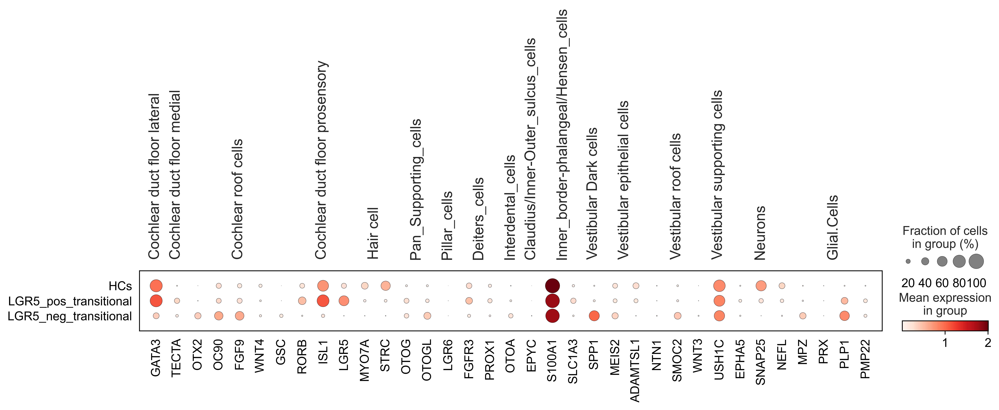

In [147]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=300,dpi_save=600)
#sc.tl.dendrogram(adata, groupby='cell_type_final')
sc.pl.dotplot(
    adata_new,
    groupby="subclasses",
    var_names=smarker_genes_in_data,
  # dendrogram=True,
    #standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
    save="human_cochlear_organoids_revision.pdf"
)

In [148]:
SC_gene = [
     "TSC22D1",'EPYC','FBXO2','TMOD1','FGFR3','GATA3','GJB2','DPYSL2','LGR6','PROX1','SMPX','S100A1',
    'AQP4','CEACAM16','SLC1A3','S100A6','FGF10','ANXA1','KCNQ5','MEIS1','CHST9','MEIS2','FST',
   'OTOG','OTOGL','LGR5',

 
 'OTOA',
     'EPYC',
     ]
   
sc.tl.score_genes(adata_raw_scvi,SC_gene)

<Axes: ylabel='score'>

[Text(0, 0, 'HCs'),
 Text(1, 0, 'LGR5_pos\ntransitional'),
 Text(2, 0, 'LGR5_neg\ntransitional')]

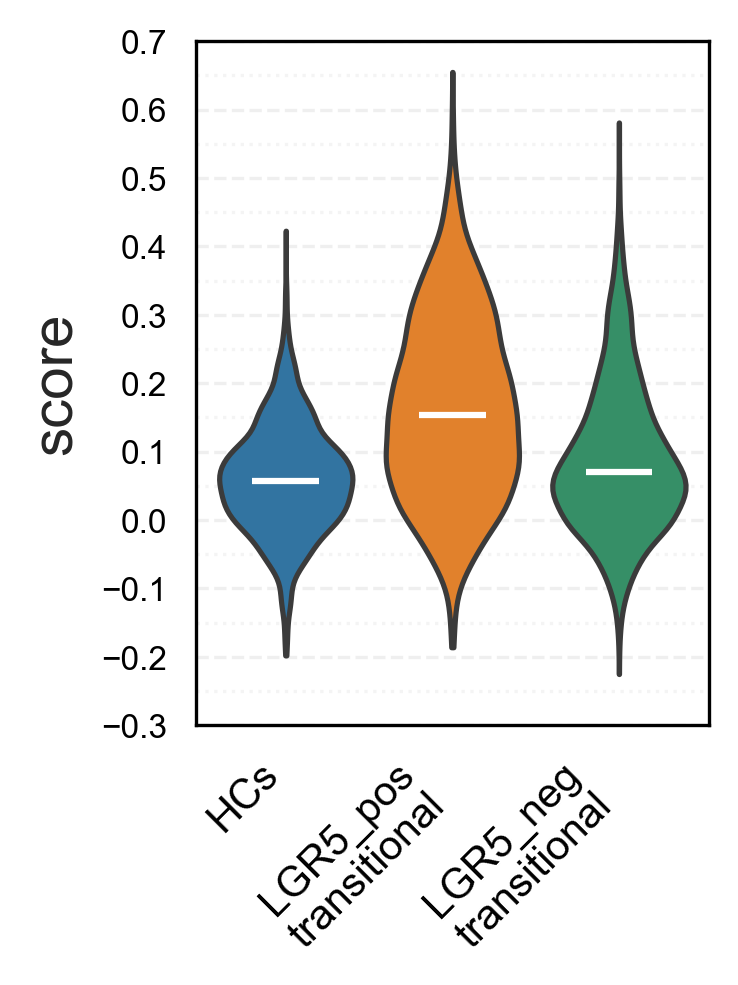

In [149]:
sc.set_figure_params(figsize=(3,3), frameon=False, dpi=150, dpi_save=600)


sc.pl.violin(
    adata_raw_scvi, 
    ['score'], 
    groupby='subclasses',
    order=['HCs', 'LGR5_pos_transitional', 'LGR5_neg_transitional'],
    jitter=False, 
    rotation=45,
    show=False,  
    stripplot=False  
)


ax = plt.gca()


for i, category in enumerate(['HCs', 'LGR5_pos_transitional', 'LGR5_neg_transitional']):
    
    median_val = adata_raw_scvi.obs[adata_raw_scvi.obs['subclasses'] == category]['score'].median()

    ax.hlines(
        median_val, 
        i - 0.2, 
        i + 0.2, 
        color='white', 
        linewidth=1.5,
        linestyle='-'
    )


x_labels = ['HCs', 'LGR5_pos\ntransitional', 'LGR5_neg\ntransitional']
ax.set_xticklabels(x_labels, fontsize=10, rotation=45, ha='right')


import numpy as np
# 
y_min, y_max = ax.get_ylim()

major_ticks = np.arange(round(y_min, 1), round(y_max, 1) + 0.1, 0.1)
ax.set_yticks(major_ticks)


minor_ticks = np.arange(round(y_min, 1), round(y_max, 1) + 0.05, 0.05)
ax.set_yticks(minor_ticks, minor=True)


ax.grid(axis='y', which='major', linestyle='--', alpha=0.3)
ax.grid(axis='y', which='minor', linestyle=':', alpha=0.2)


ax.tick_params(axis='y', labelsize=8)  


plt.subplots_adjust(bottom=0.15)


plt.tight_layout()


plt.savefig(data_dir+'figures/figure6_and_S13/human_organoid_score.pdf', 
            bbox_inches='tight', 
            dpi=600)
plt.show()